In [1]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)

Mounted at /content/drive/


In [2]:
from google.colab import files
def getLocalFiles():
    _files = files.upload()
    if len(_files) >0:
       for k,v in _files.items():
         open(k,'wb').write(v)
getLocalFiles()

Saving eda_kernel_fonctions.py to eda_kernel_fonctions.py
Saving outils_data.py to outils_data.py
Saving outils_model.py to outils_model.py
Saving outils_preprocessing.py to outils_preprocessing.py


In [3]:
!pip install phik
!pip install pycodestyle
!pip install pycodestyle_magic
!pip install flake8
!pip install verstack
!pip install texthero
!pip install boruta
!pip install BorutaShap
!pip install eli5
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 690 kB 14.0 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 947 kB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |█

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 235 kB 19.9 MB/s 
     |████████████████████████████████| 10.4 MB 84.6 MB/s 
     |████████████████████████████████| 184 kB 72.1 MB/s 
     |████████████████████████████████| 1.0 MB 63.1 MB/s 
  Attempting uninstall: srsly
    Found existing installation: srsly 2.4.3
    Uninstalling srsly-2.4.3:
      Successfully uninstalled srsly-2.4.3
  Attempting uninstall: catalogue
    Found existing installation: catalogue 2.0.7
    Uninstalling catalogue-2.0.7:
      Successfully uninstalled catalogue-2.0.7
  Attempting uninstall: thinc
    Found existing installation: thinc 8.0.17
    Uninstalling thinc-8.0.17:
      Successfully uninstalled thinc-8.0.17
  Attempting uninstall: spacy
    Found existing installation: spacy 3.3.1
    Uninstalling spacy-3.3.1:
      Successfully uninstalled spacy-3.3.1
ERROR: pip's dependency resolver does not currently take 

# <span style='color:SteelBlue'>P7 - Implémentez un modèle de scoring</span>

![image.png](attachment:image.png)

 # <span class='bg-primary'>P7_01_04 - FEATURES SELECTION</span>

Ce notebook traite de la 'feature sélection' des jeux de données des dataframes **train_set** et **test_set** composés des pré-processing (nettoyage, feature engineering)/aggrégations de tous les fichiers mis à notre disposition:

- **bureau.csv**,
- **bureau_balance.csv**,
- **credit_card_balance.csv**,
- **installments_payments.csv**,
- **POS_CASH_balance.csv**,
- **previous_application.csv**

En particulier :

- **Feature selection** : outre la génération de caractéristiques importantes/utiles, il est également essentiel de supprimer les caractéristiques redondantes et bruyantes. Si nous introduisons des déchets/bruits dans notre modèle d'apprentissage automatique, il retournera des déchets/bruits. Nous devons donc trouver de bonnes techniques de sélection des caractéristiques les plus importantes et discriminantes pour notre problématique.

***
Sources
***
Kernel Kaggle sur Home Credit :
- Feature sélection avec Lightgbm : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Feature sélection avec BORUTA : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta).
- Feature sélection avec BOOSTAROOTA : [Source](https://github.com/Murfin/nn_project/blob/master/NN%20project%20notebook%20ver.%202.ipynb)

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [ ]:
# from jyquickhelper import add_notebook_menu
# add_notebook_menu()

## <span style='background:Thistle'>1. Introduction</span>

*****
**Mission**
*****
**Développer un modèle de scoring de la probabilité de défaut de paiement du client** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

*****
**Objectifs**
*****
- analyser le jeu de données,
- Construire **un modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **dashboard interactif** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

*****
**Sources**
*****
- [Jeu de données](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **Kernel Kaggle** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur toutes les fichiers csv mis à notre disposition a été livré par **Rishabh Rao** (Student at -Jaipur, Rajasthan, India).
- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :
[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

In [4]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
# import jyquickhelper
import numpy as np
import pandas as pd
import os
import outils_data
import outils_preprocessing
import outils_model
import eda_kernel_fonctions
import pickle

import matplotlib.pyplot as plt

# Modelisation
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Features selection
from boruta import BorutaPy
from BorutaShap import BorutaShap
from collections import Counter

# Warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Lightgbm              : ' + lgb.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils pré-processing : ' + outils_preprocessing.__version__)
print('Outils model          : ' + outils_model.__version__)
print('EDA Kernel fonctions  : ' + eda_kernel_fonctions.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Version des librairies utilisées :
Python                : 3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]
NumPy                 : 1.21.6
Pandas                : 1.3.5
Lightgbm              : 3.3.0
Outils dataframe      : 0.0.4
Outils pré-processing : 0.0.0
Outils model          : 0.0.1
EDA Kernel fonctions  : 0.0.0
Lancé le           : 2022-06-18T07:29:21.395751


In [5]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 4,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Chargement des jeux de données</span>

**Chargement des dataframes nettoyés**

In [6]:
fic_sav_train_set = \
    '/content/drive/My Drive/sauvegarde/pre-processing/train_set_preproc.pickle'
# Chargement de train_set
with open(fic_sav_train_set, 'rb') as df_appli_train_set:
    train_set = pickle.load(df_appli_train_set)
train_set.shape

(307507, 615)

In [7]:
fic_sav_appli_train_imp1 = \
    '/content/drive/My Drive/sauvegarde/pre-processing/train_imp1_set_preproc.pickle'
# Chargement de train_imp1_set
with open(fic_sav_appli_train_imp1, 'rb') as df_appli_train_imp1_set:
    train_imp1_set = pickle.load(df_appli_train_imp1_set)
train_imp1_set.shape

(307507, 622)

In [8]:
fic_sav_appli_train_imp2 = \
    '/content/drive/My Drive/sauvegarde/pre-processing/train_imp2_set_preproc.pickle'
# Chargement de train_imp2_set
with open(fic_sav_appli_train_imp2, 'rb') as df_appli_train_imp2_set:
    train_imp2_set = pickle.load(df_appli_train_imp2_set)
train_imp2_set.shape

(307507, 612)

In [9]:
fic_sav_test_set = \
    '/content/drive/My Drive/sauvegarde/pre-processing/test_set_preproc.pickle'
# Chargement de test_set
with open(fic_sav_test_set, 'rb') as df_appli_test_set:
    test_set = pickle.load(df_appli_test_set)
test_set.shape

(48744, 614)

In [10]:
fic_sav_appli_test_imp1 = \
    '/content/drive/My Drive/sauvegarde/pre-processing/test_imp1_set_preproc.pickle'
# Chargement de test_imp1_set
with open(fic_sav_appli_test_imp1, 'rb') as df_appli_test_imp1_set:
    test_imp1_set = pickle.load(df_appli_test_imp1_set)
test_imp1_set.shape

(48744, 621)

In [11]:
fic_sav_appli_test_imp2 = \
    '/content/drive/My Drive/sauvegarde/pre-processing/test_imp2_set_preproc.pickle'
# Chargement de test_imp2_set
with open(fic_sav_appli_test_imp2, 'rb') as df_appli_test_imp2_set:
    test_imp2_set = pickle.load(df_appli_test_imp2_set)
test_imp2_set.shape

(48744, 613)

## <span style='background:Thistle'>3. Features selection</span> 

### <span style='background:PowderBlue'>3.1. Features selection : avec LIGHTGBM</span>

- Extrait du Kernel Kaggle : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Le but est de conserver uniquement les variables les plus pertinentes en utilisant les features importance déterminée par un modèle, Lightgbm dans notre cas.

<span style='background:Moccasin'>**Train_set/test_set**</span>

- La variable magique TARGET_NEIGHBORS_500_MEAN peut être controverser par un client sur le recueil des données des autres clients et difficile à expliquer facilement à un client donc nous allons tester avec ou sans cette variable.

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [ ]:
# Résumé des variables qualitatives
desc_train_set = outils_data.description_variables(train_set)
desc_train_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,NAME_INCOME_TYPE_STUDENT,NAME_INCOME_TYPE_UNEMPLOYED,NAME_INCOME_TYPE_WORKING,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SU

In [ ]:
# Dataframes de travail
train_sans_fs_lgbm = train_set.copy()
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                             axis=1)
print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
test_sans_fs_lgbm = test_set.copy()
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                           axis=1)
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 614)
test_sans_fs_lgbm : (48744, 613)


In [ ]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_sans_fs_lgbm_labels = train_sans_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_sans_fs_lgbm_ids = train_sans_fs_lgbm['SK_ID_CURR']
test_sans_fs_lgbm_ids = test_sans_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_sans_fs_lgbm, test_sans_fs_lgbm = \
    train_sans_fs_lgbm.align(test_sans_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_fs_lgbm : (307507, 612)
test_fs_lgbm : (48744, 612)


**Modélisation**

***Premier passage***

In [ ]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_sans = np.zeros(train_sans_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [ ]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_sans_features, valid_sans_features, train_sans_y, valid_sans_y = \
        train_test_split(train_sans_fs_lgbm, train_sans_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_sans_features, train_sans_y,
              early_stopping_rounds=100,
              eval_set=[(valid_sans_features, valid_sans_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_sans += model.feature_importances_

[200]	valid_0's auc: 0.792033	valid_0's binary_logloss: 0.505553
[200]	valid_0's auc: 0.786867	valid_0's binary_logloss: 0.503702


In [ ]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_sans = feature_importances_sans / 2
df_fs_sans_lightgbm = \
    pd.DataFrame({'feature': list(train_sans_fs_lgbm.columns),
                  'importance': feature_importances_sans}) \
    .sort_values('importance', ascending=False)

df_fs_sans_lightgbm.head()

,feature,importance
69,CREDIT_ANNUITY_RATIO,129.5
78,EXT_SOURCE_SUM,117.0
253,INST_PAY_DAYS_PAYMENT_RATIO_MAX,85.5
9,DAYS_BIRTH,85.5
26,EXT_SOURCE_1,66.5


In [ ]:
# Exploration des variables avec zéro importance
zero_features_sans = \
    list(df_fs_sans_lightgbm[df_fs_sans_lightgbm['importance'] == 0.0][
        'feature'])
print(f'{len(zero_features_sans)} variables avec 0.0 importance :\n')
zero_features_sans

214 variables avec 0.0 importance :



['PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_MEAN',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_2',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'REG_REGION_NOT_WORK_REGION',
 'NAME_TYPE_SUITE_GROUP_OF_PEOPLE',
 'PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_SUM',
 'BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_OTHERS_WITHOUT_INTEREST_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_OTHER_WITH_INTEREST_SUM',
 'ORGANIZATION_TYPE_ADVERTISING',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITHOUT_INTEREST_SUM',
 'FLAG_DOCUMENT_19',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_SUM',
 'ORGANIZATION_TYPE_ELECTRICITY',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_MIDDLE_SUM',
 'ORGANIZATION_TYPE_CULTURE',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',
 'FLAG_DOCUMENT_18',
 'ORGANIZATION_TYPE_CLEANING',
 'FLAG_MOBIL',
 'ORGANIZATION_TYPE_AGRICULTURE',
 'FLAG_DOCUMENT_20',
 'FLA

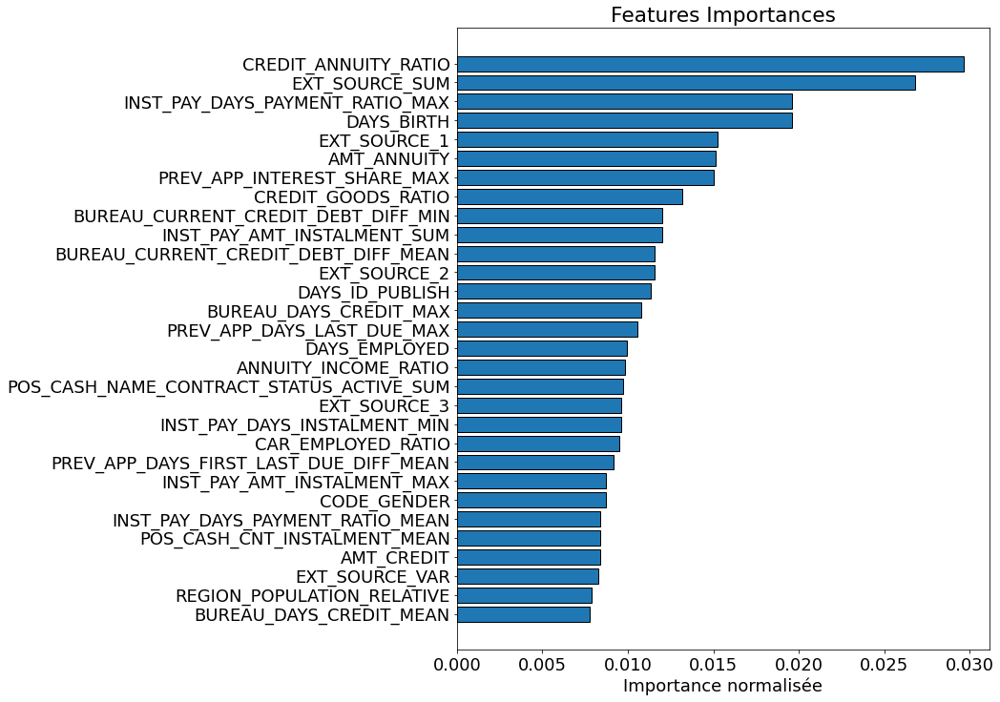

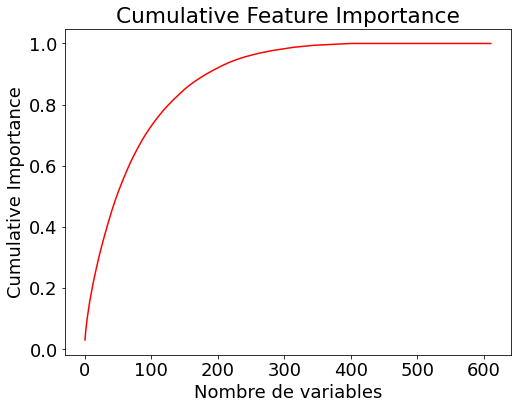

184 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_sans_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_sans_lightgbm)

In [ ]:
# Suppression des variables avec zéro importance
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=zero_features_sans)
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=zero_features_sans)

print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 398)
test_sans_fs_lgbm : (48744, 398)


***Second passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2_sans, df_fs_sans_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_sans_fs_lgbm,
                                       train_sans_fs_lgbm_labels)

[200]	valid_0's auc: 0.793098	valid_0's binary_logloss: 0.505703
[200]	valid_0's auc: 0.785048	valid_0's binary_logloss: 0.504493

There are 21 features with 0.0 importance


**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_sans_lightgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_lightgbm.pickle'
with open(fic_sav_fs_sans_lightgbm, 'wb') as f:
    pickle.dump(df_fs_sans_lightgbm_2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [12]:
# Chargement des features importance de ligthgbm
fic_sav_fs_sans_lightgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_lightgbm, 'rb') as df_fs_sans_lightgbm:
    df_fs_sans_lightgbm = pickle.load(df_fs_sans_lightgbm)
df_fs_sans_lightgbm.shape

(398, 2)

In [13]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = pd.DataFrame({})
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_lightgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'lightgbm')

train_sans_set - lightgbm : 398 variables importantes conservées


<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [ ]:
# Résumé des variables qualitatives
desc_train_set = outils_data.description_variables(train_set)
desc_train_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,NAME_INCOME_TYPE_STUDENT,NAME_INCOME_TYPE_UNEMPLOYED,NAME_INCOME_TYPE_WORKING,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SU

In [ ]:
# Dataframes de travail
train_fs_lgbm = train_set.copy()
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm = test_set.copy()
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 615)
test_fs_lgbm : (48744, 614)


In [ ]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_fs_lgbm_labels = train_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_fs_lgbm_ids = train_fs_lgbm['SK_ID_CURR']
test_fs_lgbm_ids = test_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_fs_lgbm, test_fs_lgbm = train_fs_lgbm.align(test_fs_lgbm,
                                                  join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_lgbm = train_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_fs_lgbm = test_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 613)
test_fs_lgbm : (48744, 613)


**Modélisation**

***Premier passage***

In [ ]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances = np.zeros(train_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [ ]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_features, valid_features, train_y, valid_y = \
        train_test_split(train_fs_lgbm, train_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_features, train_y,
              early_stopping_rounds=100,
              eval_set=[(valid_features, valid_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances += model.feature_importances_

[200]	valid_0's auc: 0.797277	valid_0's binary_logloss: 0.500494
[200]	valid_0's auc: 0.792399	valid_0's binary_logloss: 0.498464


In [ ]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances = feature_importances / 2
df_fs_lightgbm = \
    pd.DataFrame({'feature': list(train_fs_lgbm.columns),
                  'importance': feature_importances}) \
    .sort_values('importance', ascending=False)

df_fs_lightgbm.head()

,feature,importance
85,TARGET_NEIGHBORS_500_MEAN,173.5
9,DAYS_BIRTH,95.5
254,INST_PAY_DAYS_PAYMENT_RATIO_MAX,89.0
78,EXT_SOURCE_SUM,72.5
26,EXT_SOURCE_1,71.0


In [ ]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features = \
    list(df_fs_lightgbm[df_fs_lightgbm['importance'] == 0.0]['feature'])
print(f'{len(zero_features)} variables avec 0.0 importance :\n')
zero_features

183 variables avec 0.0 importance :



['ORGANIZATION_TYPE_MOBILE',
 'CCB_SK_DPD_DEF_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_MAX',
 'ORGANIZATION_TYPE_TRADE_TYPE_2',
 'ORGANIZATION_TYPE_INSURANCE',
 'FLAG_DOCUMENT_21',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_19',
 'ORGANIZATION_TYPE_RELIGION',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_14',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_6',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_8',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_7',
 'ORGANIZATION_TYPE_TRADE_TYPE_5',
 'ORGANIZATION_TYPE_HOUSING',
 'NAME_FAMILY_STATUS_SEPARATED',
 'ORGANIZATION_TYPE_TRADE_TYPE_6',
 'FLAG_MOBIL',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_10',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_11',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_12',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_13',
 'NAME_INCOME_TYPE_UNEMPLOYED',
 'NAME_INCOME_TYPE_STUDENT',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_2',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_3',
 'NAME_INCOME_TYPE_BUSINESSMAN',
 'NAME_TYPE_SUITE_OTHER_B',
 'NAME_TYPE_SUITE

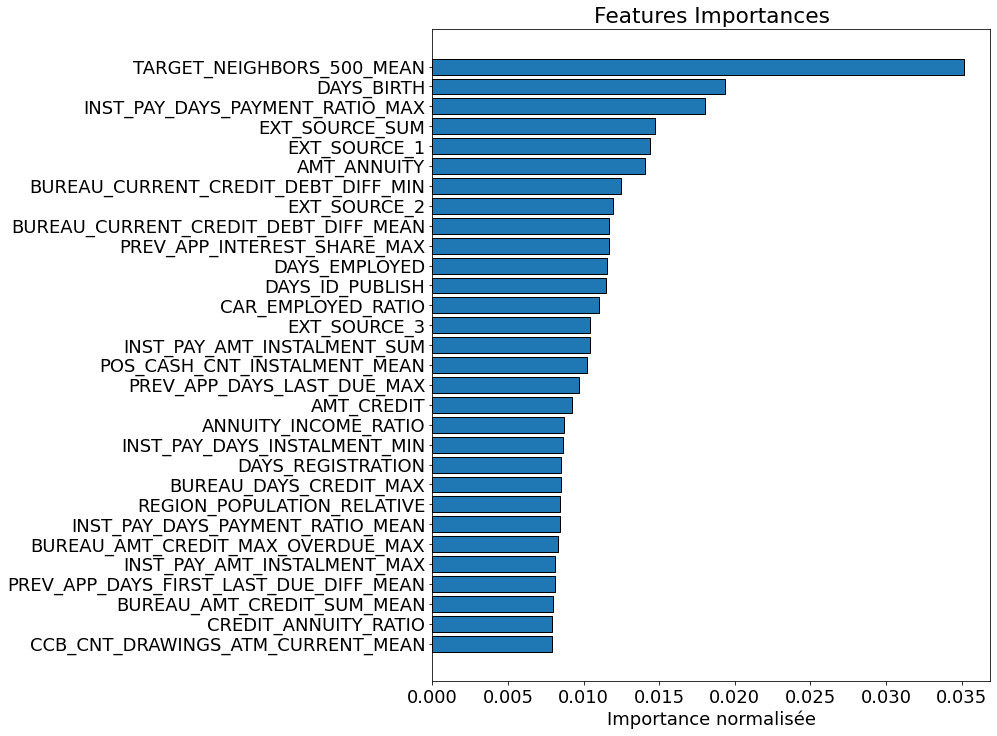

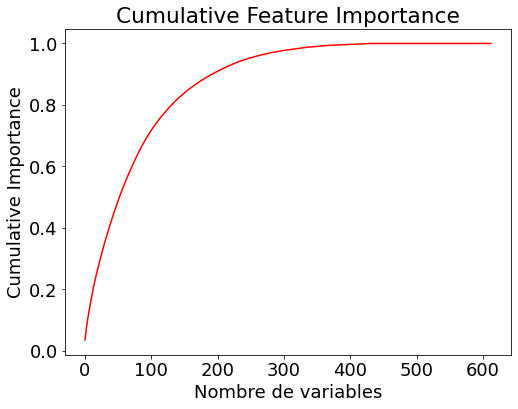

193 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm)

In [ ]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 430)
test_fs_lgbm : (48744, 430)


***Second passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2, df_fs_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797934	valid_0's binary_logloss: 0.501166
[200]	valid_0's auc: 0.790819	valid_0's binary_logloss: 0.499118

There are 44 features with 0.0 importance


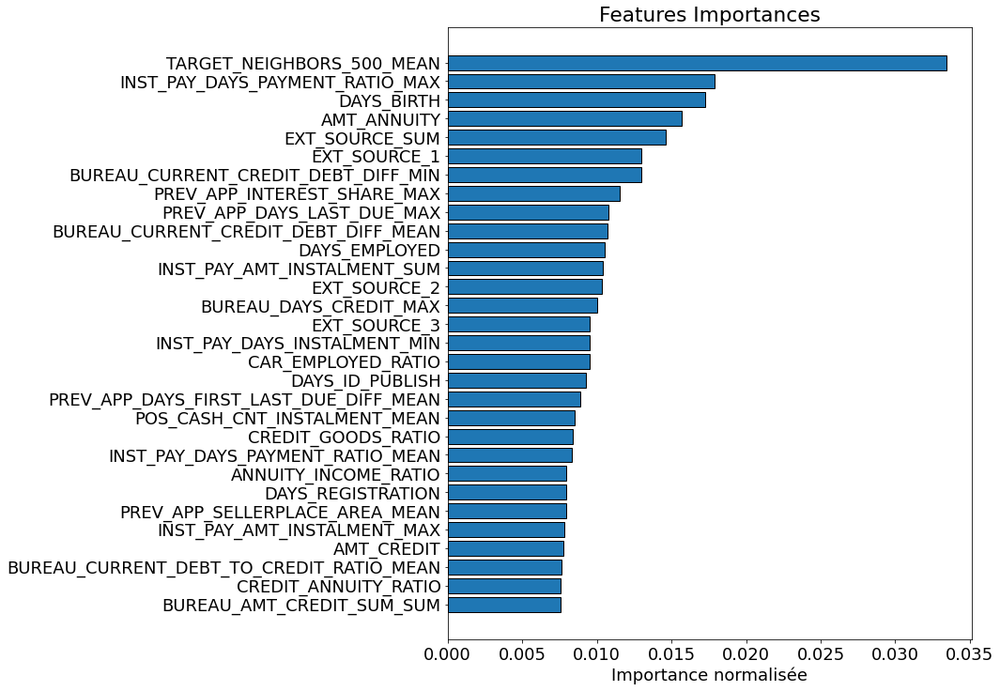

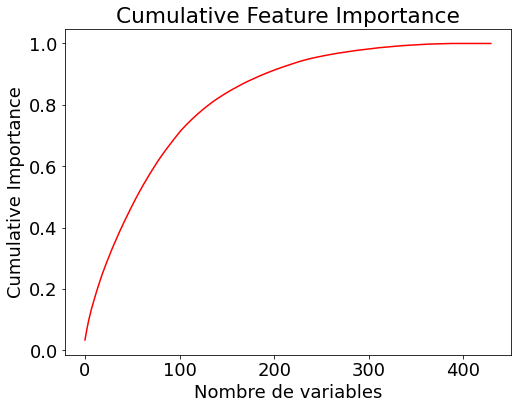

191 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_2)

In [ ]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_2)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_2)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 386)
test_fs_lgbm : (48744, 386)


***Troisième passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_3, df_fs_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797934	valid_0's binary_logloss: 0.501166
[200]	valid_0's auc: 0.791565	valid_0's binary_logloss: 0.498539

There are 0 features with 0.0 importance


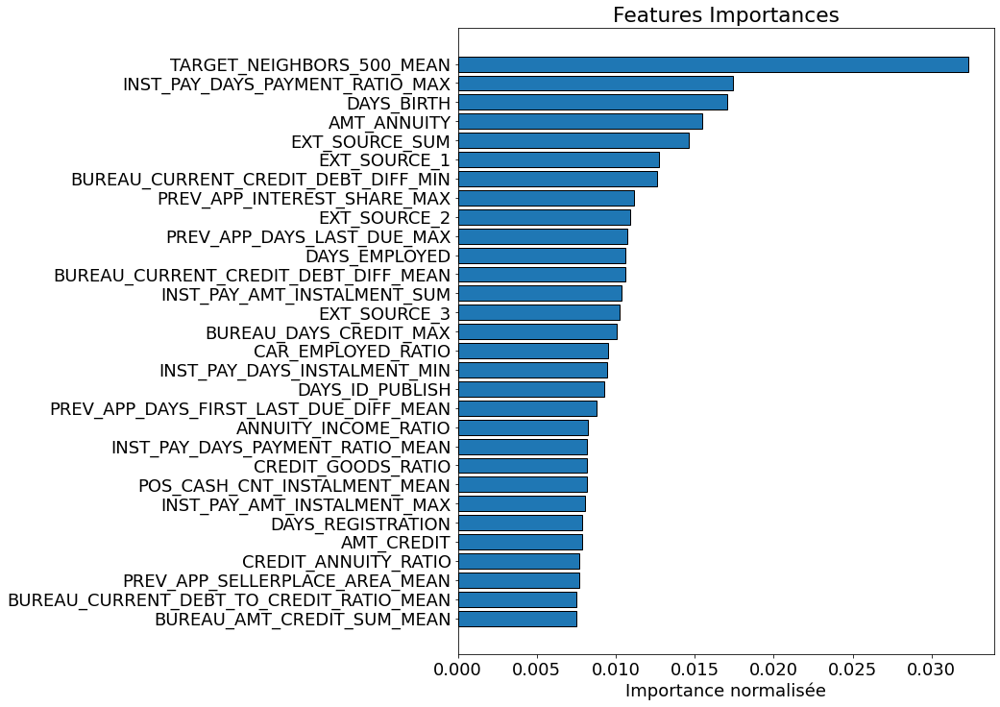

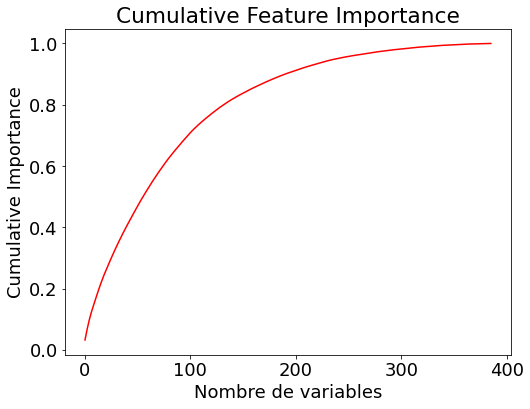

191 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_3)

In [ ]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_3)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_3)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 386)
test_fs_lgbm : (48744, 386)


***Quatrième passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_4, df_fs_lightgbm_4 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797934	valid_0's binary_logloss: 0.501166
[200]	valid_0's auc: 0.791565	valid_0's binary_logloss: 0.498539

There are 0 features with 0.0 importance


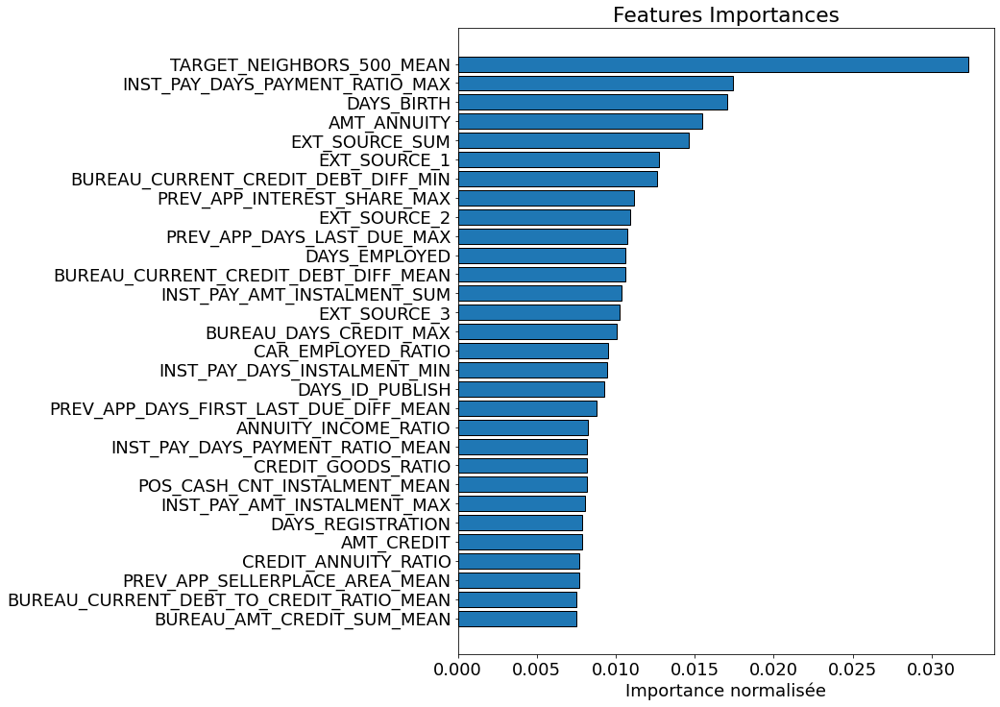

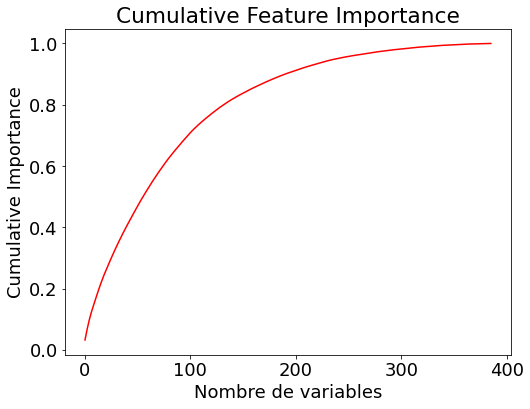

191 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_4 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_4)

**Reconstitution des dataframes**

In [ ]:
train_fs_lgbm['TARGET'] = train_fs_lgbm_labels
train_fs_lgbm['SK_ID_CURR'] = train_fs_lgbm_ids
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm['SK_ID_CURR'] = test_fs_lgbm_ids
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 388)
test_fs_lgbm : (48744, 387)


**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_lightgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_lightgbm.pickle'
with open(fic_sav_fs_lightgbm, 'wb') as f:
    pickle.dump(df_fs_lightgbm_4, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [14]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_set, 'rb') as df_fs_train_set:
    df_fs_lightgbm = pickle.load(df_fs_train_set)
df_fs_lightgbm.shape

(386, 2)

In [15]:
# Sauvegarde du nombre de features importance
df_fs_train_set = pd.DataFrame({})
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_lightgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'lightgbm')

train_set - lightgbm : 386 variables importantes conservées


<span style='background:Moccasin'>**Train_imp1_set/test_imp1_set**</span>

**Préparation des dataframes de travail**

In [ ]:
# Résumé des variables qualitatives
desc_train_imp1_set = outils_data.description_variables(train_imp1_set)
desc_train_imp1_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,CREDIT_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MUL,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,INCOME_APARTMENT_AVG_MUL,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_XNA,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM,BUREAU_CREDIT_TYPE_L

In [ ]:
# Dataframes de travail
train_imp1_fs_lgbm = train_imp1_set.copy()
print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
test_imp1_fs_lgbm = test_imp1_set.copy()
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 622)
test_imp1_fs_lgbm : (48744, 621)


In [ ]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_imp1_fs_lgbm_labels = train_imp1_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_imp1_fs_lgbm_ids = train_imp1_fs_lgbm['SK_ID_CURR']
test_imp1_fs_lgbm_ids = test_imp1_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_imp1_fs_lgbm, test_imp1_fs_lgbm = \
    train_imp1_fs_lgbm.align(test_imp1_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 620)
test_imp1_fs_lgbm : (48744, 620)


**Modélisation**

***Premier passage***

In [ ]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_imp1 = np.zeros(train_imp1_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [ ]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_imp1_features, valid_imp1_features, train_imp1_y, valid_imp1_y = \
        train_test_split(train_imp1_fs_lgbm, train_imp1_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_imp1_features, train_imp1_y,
              early_stopping_rounds=100,
              eval_set=[(valid_imp1_features, valid_imp1_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_imp1 += model.feature_importances_

[200]	valid_0's auc: 0.7959	valid_0's binary_logloss: 0.503258
[200]	valid_0's auc: 0.790921	valid_0's binary_logloss: 0.500433


In [ ]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_imp1 = feature_importances_imp1 / 2
df_fs_imp1_lightgbm = \
    pd.DataFrame({'feature': list(train_imp1_fs_lgbm.columns),
                  'importance': feature_importances_imp1}) \
    .sort_values('importance', ascending=False)

df_fs_imp1_lightgbm.head()

,feature,importance
87,TARGET_NEIGHBORS_500_MEAN,199.0
9,DAYS_BIRTH,109.5
261,INST_PAY_DAYS_PAYMENT_RATIO_MAX,103.5
27,EXT_SOURCE_2,100.0
10,DAYS_EMPLOYED,87.0


In [ ]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features_imp1 = \
    list(df_fs_imp1_lightgbm[df_fs_imp1_lightgbm['importance'] == 0.0][
    'feature'])
print(f'{len(zero_features_imp1)} variables avec 0.0 importance :\n')
zero_features_imp1

164 variables avec 0.0 importance :



['ORGANIZATION_TYPE_CULTURE',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_4',
 'WALLSMATERIAL_MODE_MIXED',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_2',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'ORGANIZATION_TYPE_CLEANING',
 'FLAG_DOCUMENT_14',
 'ORGANIZATION_TYPE_ADVERTISING',
 'BUREAU_CREDIT_ACTIVE_SOLD_SUM',
 'WALLSMATERIAL_MODE_BLOCK',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'WALLSMATERIAL_MODE_MONOLITHIC',
 'FLAG_DOCUMENT_21',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM',
 'WALLSMATERIAL_MODE_WOODEN',
 'ORGANIZATION_TYPE_ELECTRICITY',
 'CCB_NAME_CONTRACT_STATUS_APPROVED_SUM',
 'CCB_NAME_CONTRACT_STATUS_DEMAND_SUM',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_19',
 'ORGANIZATION_TYPE_AGRICULTURE',
 'CCB_NAME_CONTRACT_STATUS_REFUSED_SUM',
 'FLAG_DOCUMENT_15',
 'CCB_NAME_CONTRACT_STATUS_SENT_PROPOSAL_SUM',
 'FLAG_DOCUMENT_17',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_SUM',
 'FLAG_DOCUMENT_7',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_2',
 'PREV_APP_NAME_GOODS_CAT

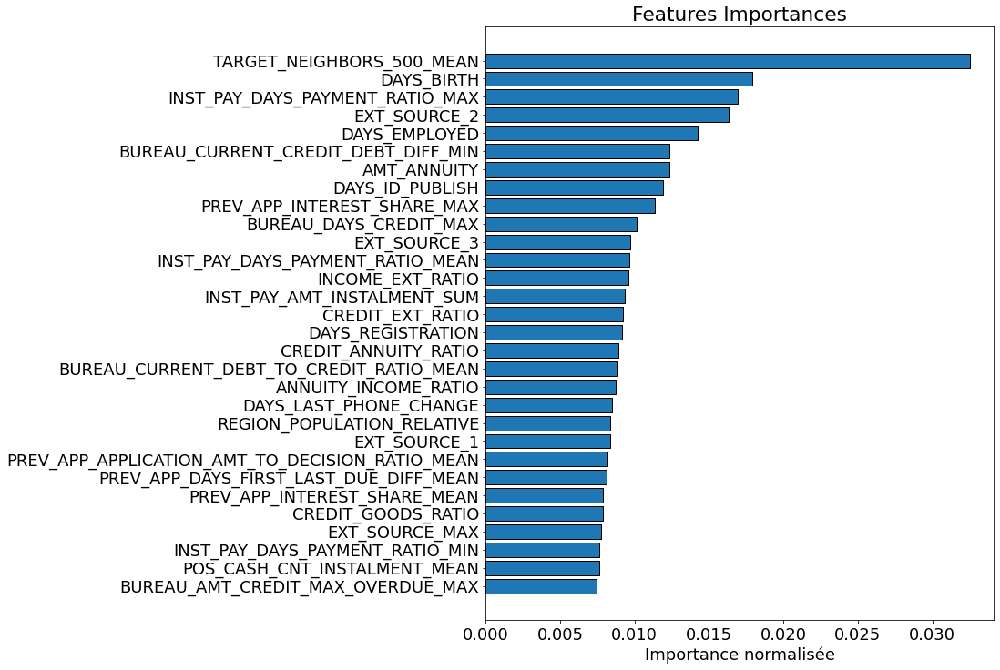

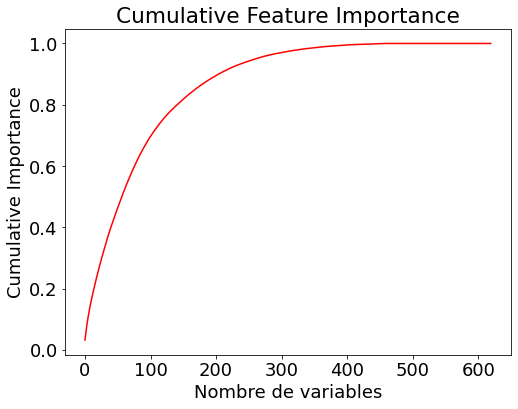

205 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm)

In [ ]:
# Suppression des variables avec zéro importance
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=zero_features_imp1)
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=zero_features_imp1)

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 456)
test_imp1_fs_lgbm : (48744, 456)


***Second passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp1_2, df_fs_imp1_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp1_fs_lgbm,
                                       train_imp1_fs_lgbm_labels)

[200]	valid_0's auc: 0.795615	valid_0's binary_logloss: 0.503057
[200]	valid_0's auc: 0.790311	valid_0's binary_logloss: 0.500958

There are 37 features with 0.0 importance


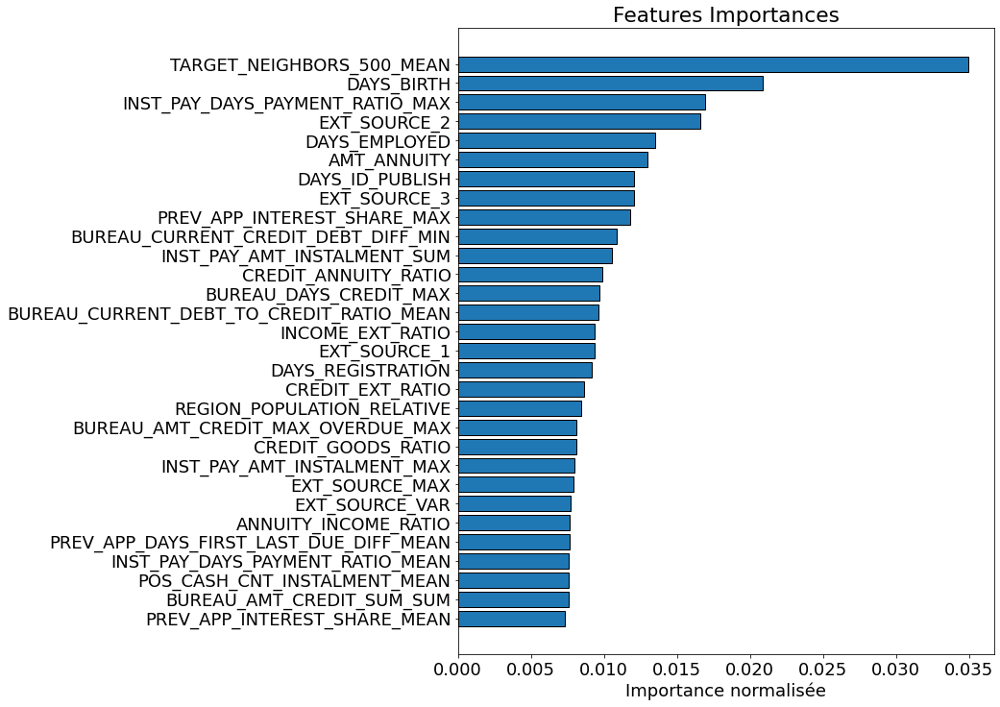

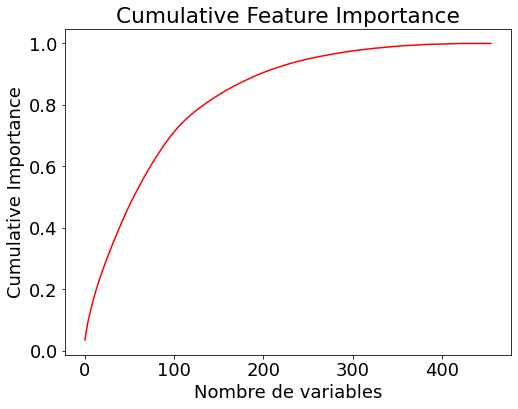

197 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm_2)

In [ ]:
# Suppression des variables avec zéro importance
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=zero_features_imp1_2)
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=zero_features_imp1_2)

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 419)
test_imp1_fs_lgbm : (48744, 419)


***Troisième passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp1_3, df_fs_imp1_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp1_fs_lgbm,
                                       train_imp1_fs_lgbm_labels)

[200]	valid_0's auc: 0.795615	valid_0's binary_logloss: 0.503057
[200]	valid_0's auc: 0.790289	valid_0's binary_logloss: 0.50098

There are 0 features with 0.0 importance


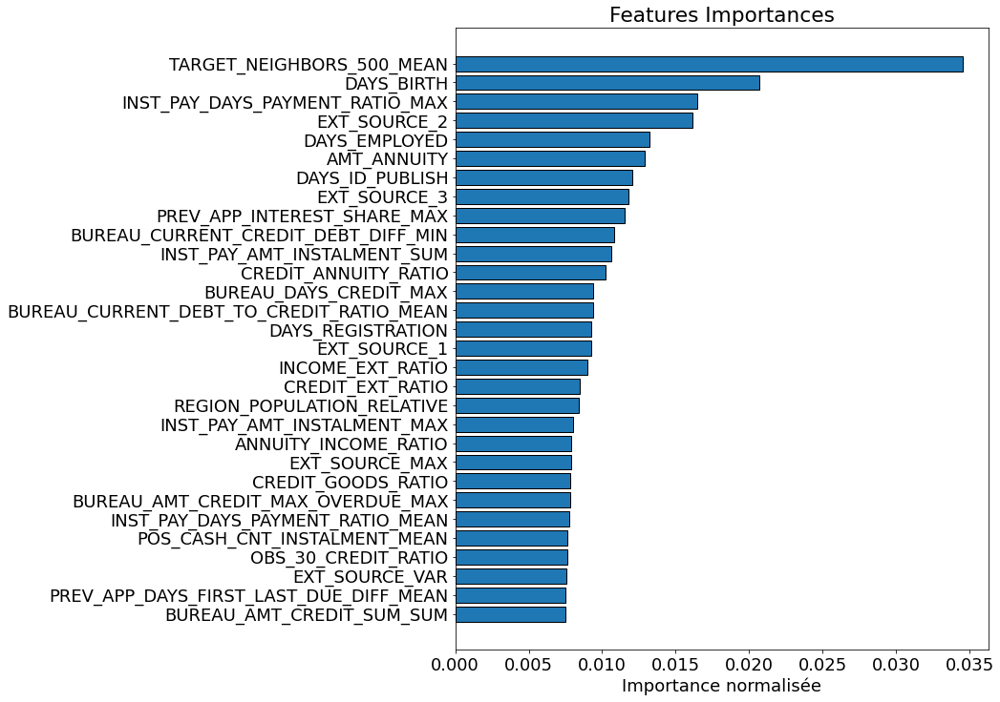

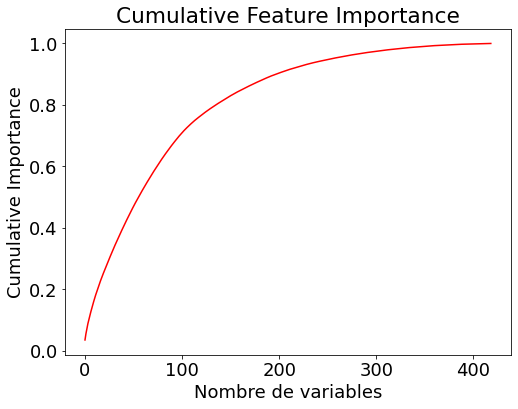

198 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm_3)

**Reconstitution des dataframes**

In [ ]:
train_imp1_fs_lgbm['TARGET'] = train_imp1_fs_lgbm_labels
train_imp1_fs_lgbm['SK_ID_CURR'] = train_imp1_fs_lgbm_ids
print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
test_imp1_fs_lgbm['SK_ID_CURR'] = test_imp1_fs_lgbm_ids
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 421)
test_imp1_fs_lgbm : (48744, 420)


**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_imp1_lightgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp1_lightgbm.pickle'
with open(fic_sav_fs_imp1_lightgbm, 'wb') as f:
    pickle.dump(df_fs_imp1_lightgbm_3, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [16]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp1_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_imp1_set, 'rb') as df_fs_train_imp1_set:
    df_fs_imp1_lightgbm = pickle.load(df_fs_train_imp1_set)
df_fs_imp1_lightgbm.shape

(419, 2)

In [17]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = pd.DataFrame({})
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_lightgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'lightgbm')

train_imp1_set - lightgbm : 419 variables importantes conservées


<span style='background:Moccasin'>**Train_imp2_set/test_imp2_set**</span>

**Préparation des dataframes de travail**

In [ ]:
# Résumé des variables qualitatives
desc_train_imp2_set = outils_data.description_variables(train_imp2_set)
desc_train_imp2_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BUILD_AVG,FLOORSMIN_AVG,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_XNA,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,NAME_INCOME_TYPE_STUDENT,NAME_INCOME_TYPE_UNEMPLOYED,NAME_INCOME_TYPE_WORKING,NAME_INCOME_TYPE_XNA,NAME_EDUCATION_TYPE_ACADEMIC_DEGREE,...,PREV_APP_NAME_CONTRACT_STATUS_LAST,PREV_APP_DAYS_DECISION_MEAN,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_C

In [ ]:
# Dataframes de travail
train_imp2_fs_lgbm = train_imp2_set.copy()
print(f'train_fs_lgbm : {train_imp2_fs_lgbm.shape}')
test_imp2_fs_lgbm = test_imp2_set.copy()
print(f'test_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_fs_lgbm : (307507, 612)
test_fs_lgbm : (48744, 613)


In [ ]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_imp2_fs_lgbm_labels = train_imp2_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_imp2_fs_lgbm_ids = train_imp2_fs_lgbm['SK_ID_CURR']
test_imp2_fs_lgbm_ids = test_imp2_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_imp2_fs_lgbm, test_im2_fs_lgbm = \
    train_imp2_fs_lgbm.align(test_imp2_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 610)
test_imp2_fs_lgbm : (48744, 612)


**Modélisation**

***Premier passage***

In [ ]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_imp2 = np.zeros(train_imp2_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [ ]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_imp2_features, valid_imp2_features, train_imp2_y, valid_imp2_y = \
        train_test_split(train_imp2_fs_lgbm, train_imp2_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_imp2_features, train_imp2_y,
              early_stopping_rounds=100,
              eval_set=[(valid_imp2_features, valid_imp2_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_imp2 += model.feature_importances_

[200]	valid_0's auc: 0.797511	valid_0's binary_logloss: 0.501656
[200]	valid_0's auc: 0.790746	valid_0's binary_logloss: 0.500562


In [ ]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_imp2 = feature_importances_imp2 / 2
df_fs_imp2_lightgbm = \
    pd.DataFrame({'feature': list(train_imp2_fs_lgbm.columns),
                  'importance': feature_importances_imp2}) \
    .sort_values('importance', ascending=False)

df_fs_imp2_lightgbm.head()

,feature,importance
81,TARGET_NEIGHBORS_500_MEAN,173.5
9,DAYS_BIRTH,102.5
255,INST_PAY_DAYS_PAYMENT_RATIO_MAX,93.0
541,PREV_APP_INTEREST_SHARE_MAX,77.5
25,EXT_SOURCE_1,77.0


In [ ]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features_imp2 = \
    list(df_fs_imp2_lightgbm[df_fs_imp2_lightgbm['importance'] == 0.0][
    'feature'])
print(f'{len(zero_features_imp2)} variables avec 0.0 importance :\n')
zero_features_imp2

179 variables avec 0.0 importance :



['CCB_NAME_CONTRACT_STATUS_SENT_PROPOSAL_SUM',
 'NAME_FAMILY_STATUS_WIDOW',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_MEAN',
 'OCCUPATION_TYPE_HR_STAFF',
 'OCCUPATION_TYPE_MANAGERS',
 'OCCUPATION_TYPE_COOKING_STAFF',
 'FLAG_DOCUMENT_9',
 'NAME_FAMILY_STATUS_XNA',
 'NAME_HOUSING_TYPE_RENTED_APARTMENT',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_SUM',
 'FLAG_EMP_PHONE',
 'WALLSMATERIAL_MODE_MIXED',
 'NAME_HOUSING_TYPE_CO_OP_APARTMENT',
 'WALLSMATERIAL_MODE_OTHERS',
 'HOUSETYPE_MODE_TERRACED_HOUSE',
 'FLAG_DOCUMENT_5',
 'FLAG_MOBIL',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_MEAN',
 'OCCUPATION_TYPE_IT_STAFF',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'CCB_NAME_CONTRACT_STATUS_DEMAND_SUM',
 'BUREAU_CREDIT_TYPE_MOBILE_OPERATOR_LOAN_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_15',
 'OCCUPATION_TYPE_PRIVATE_SERVICE_STAFF',
 'FLAG_DOCUMENT_14',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',
 'BUREAU_CREDIT_A

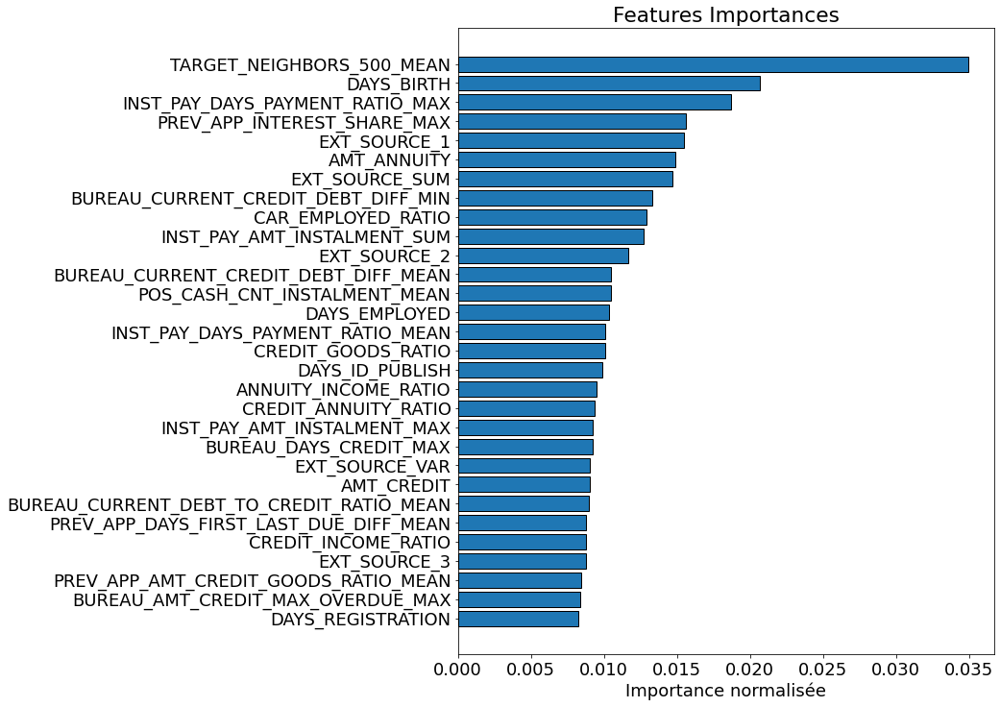

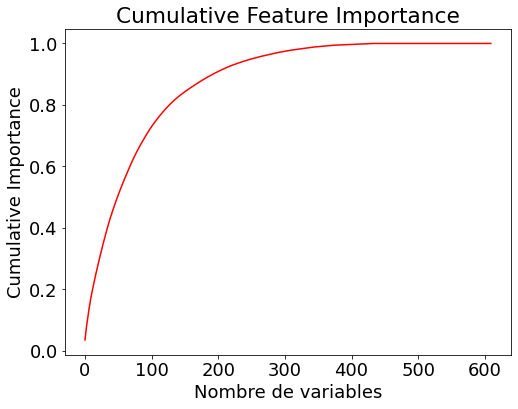

193 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm)

In [ ]:
# Suppression des variables avec zéro importance
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=zero_features_imp2)
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=zero_features_imp2)

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 431)
test_imp2_fs_lgbm : (48744, 433)


***Second passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp2_2, df_fs_imp2_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp2_fs_lgbm,
                                       train_imp2_fs_lgbm_labels)

[200]	valid_0's auc: 0.79575	valid_0's binary_logloss: 0.501557
[200]	valid_0's auc: 0.79208	valid_0's binary_logloss: 0.499527

There are 19 features with 0.0 importance


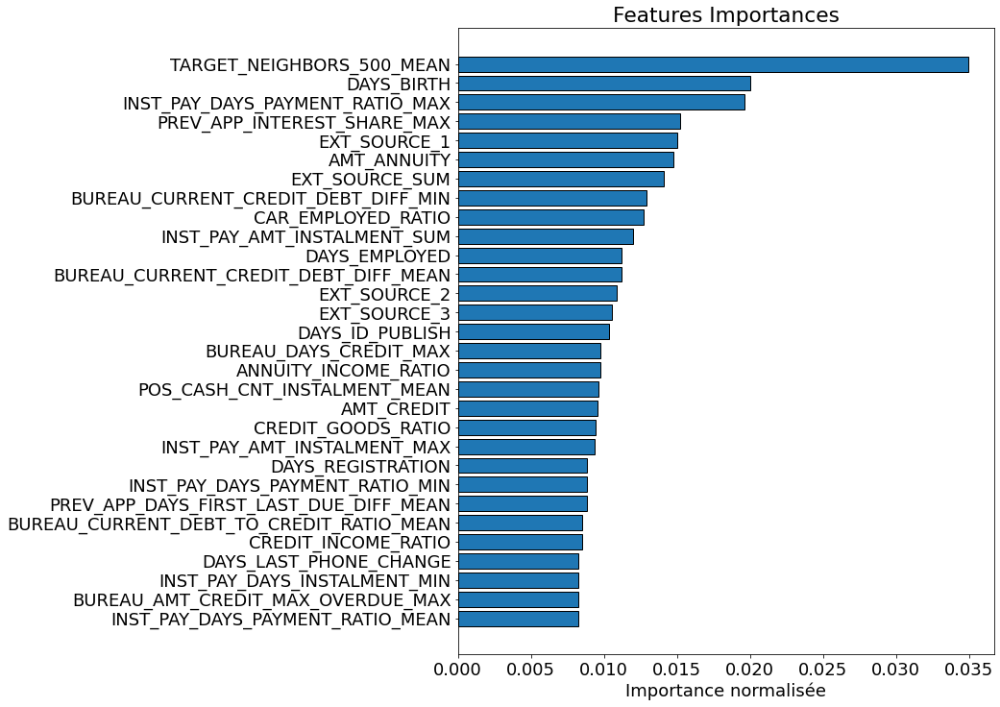

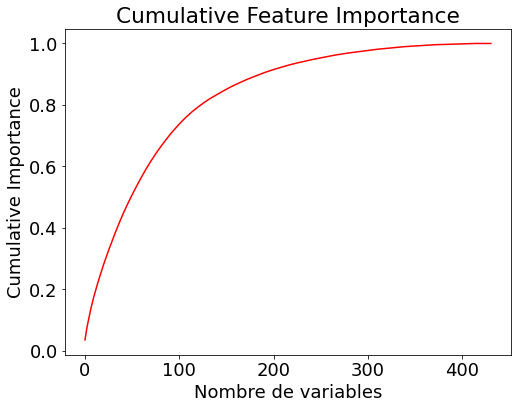

187 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm_2)

In [ ]:
# Suppression des variables avec zéro importance
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=zero_features_imp2_2)
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=zero_features_imp2_2)

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 412)
test_imp2_fs_lgbm : (48744, 414)


***Troisième passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp2_3, df_fs_imp2_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp2_fs_lgbm,
                                       train_imp2_fs_lgbm_labels)

[200]	valid_0's auc: 0.79559	valid_0's binary_logloss: 0.502136
[200]	valid_0's auc: 0.792061	valid_0's binary_logloss: 0.499104

There are 0 features with 0.0 importance


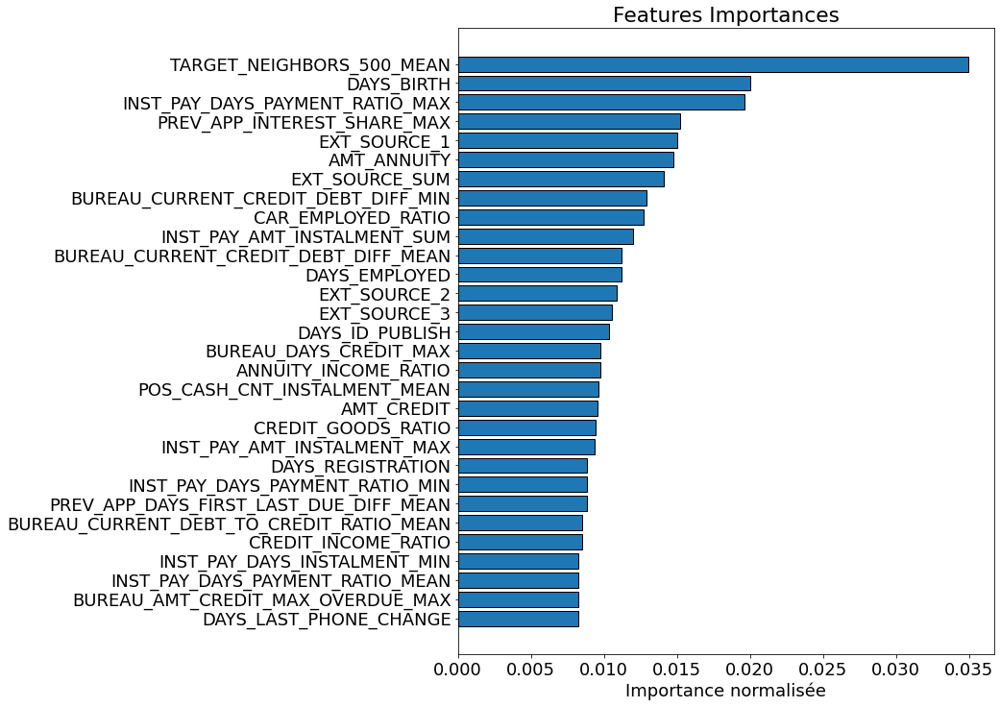

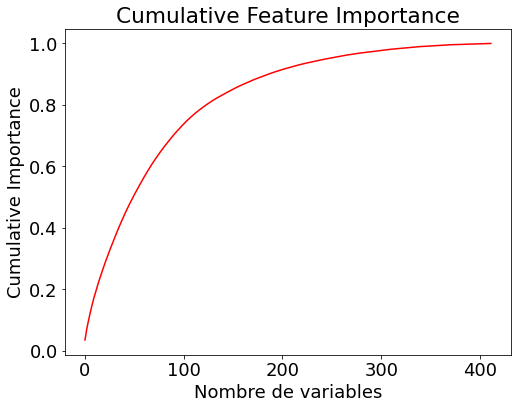

187 variables nécessaires pour 0.90 de cumulative importance


In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm_3)

**Reconstitution des dataframes**

In [ ]:
train_imp2_fs_lgbm['TARGET'] = train_imp2_fs_lgbm_labels
train_imp2_fs_lgbm['SK_ID_CURR'] = train_imp2_fs_lgbm_ids
print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
test_imp2_fs_lgbm['SK_ID_CURR'] = test_imp2_fs_lgbm_ids
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 414)
test_imp2_fs_lgbm : (48744, 415)


**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_imp2_lightgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp2_lightgbm.pickle'
with open(fic_sav_fs_imp2_lightgbm, 'wb') as f:
    pickle.dump(df_fs_imp2_lightgbm_3, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [18]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp2_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_imp2_set, 'rb') as df_fs_train_imp2_set:
    df_fs_imp2_lightgbm = pickle.load(df_fs_train_imp2_set)
df_fs_imp2_lightgbm.shape

(412, 2)

In [19]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = pd.DataFrame({})
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_lightgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'lightgbm')

train_imp2_set - lightgbm : 412 variables importantes conservées


### <span style='background:PowderBlue'>3.2. Features selection : avec BORUTA</span>

- Extrait du Kernel Kaggle de Robert Smith : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta)

Boruta, comme RFE, est une technique de sélection de caractéristiques basée sur des enveloppes. Elle est moins connue mais tout aussi puissante. L'idée derrière Boruta est très simple. Étant donné un ensemble de données tabulaires, nous ajustons itérativement un algorithme supervisé (généralement un modèle basé sur un arbre) sur une version étendue des données. La version étendue, à chaque itération, est composée des données d'origine avec, attachée horizontalement, une copie des colonnes mélangées. Nous ne conservons que les caractéristiques qui, dans chaque itération :
ont une plus grande importance que la meilleure des caractéristiques mélangées ;
sont meilleures que prévu par rapport au hasard (en utilisant une distribution binomiale).

- Boruta : [Source](https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a) [Source](https://towardsdatascience.com/boruta-and-shap-for-better-feature-selection-20ea97595f4a) [Source](https://blog.exploratory.io/finding-variable-importance-with-random-forest-boruta-28badd116197) [Source](https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a)

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

***Avec model RandomForestClassifier***

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_fs_boruta = train_set.copy()
print(f'train_fs_boruta : {train_fs_boruta.shape}')

train_fs_boruta : (307507, 615)


In [ ]:
# Sauvegarde des étiquettes
train_fs_boruta_labels = train_fs_boruta['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta = train_fs_boruta.drop(columns=['SK_ID_CURR'])
train_fs_boruta = train_fs_boruta.drop(columns=['TARGET'])

print(f'train_fs_boruta : {train_fs_boruta.shape}')

train_fs_boruta : (307507, 613)


In [ ]:
# Initialisation des variables
X = train_fs_boruta.values
y = train_fs_boruta_labels.values.ravel()

- Ensuite, nous configurons le RandomForestClassifier comme estimateur
à utiliser pour Boruta.
- Le max_depth de l'arbre est conseillé sur la page Github de Boruta pour
être entre 3 et 7.

In [ ]:
rf = RandomForestClassifier(n_jobs=-1,
                            class_weight='balanced',
                            max_depth=5)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [ ]:
# Initialisation de Boruta
boruta_feature_selector = BorutaPy(rf,
                                   n_estimators='auto',
                                   verbose=2,
                                   random_state=21,
                                   max_iter=50,
                                   perc=90)
# Entraînement
boruta_feature_selector.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	9 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	10 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	11 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	12 / 50
Confirmed: 	228
Tentative: 	74
Rejected: 	311
Iteration: 	13 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	14 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	15 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	16 / 50
Confirmed: 	229
Tent

BorutaPy(estimator=RandomForestClassifier(class_weight='balanced', max_depth=5,
                                          n_estimators=446, n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x7FD8EDC3B160),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x7FD8EDC3B160, verbose=2)

In [ ]:
# On applique le modèle sur le dataset
X_filtered = boruta_feature_selector.transform(X)
X_filtered.shape

(307507, 230)

![image.png](attachment:image.png)

In [ ]:
# Liste des variables confirmées avec une haute importance
fs_boruta = list()
features = [f for f in train_fs_boruta.columns]
indexes = np.where(boruta_feature_selector.support_ == True)
for x in np.nditer(indexes):
    fs_boruta.append(features[x])
display(f'fs_boruta : {fs_boruta}')

"fs_boruta : ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'INCOME_EXT_RATIO', 'LAST_PHONE_EMPLOYED_RATIO', 'CAR_EMPLOYED_RATIO', 'FLAG_CONTACTS_SUM', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'OBS_DEF_30_MUL', 'OBS_30_CRE

In [ ]:
# Dataframe de features importance avec boruta
df_fs_boruta = pd.DataFrame(fs_boruta)

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta.pickle'
with open(fic_sav_fs_boruta, 'wb') as f:
    pickle.dump(df_fs_boruta, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [20]:
# Chargement des features importance de boruta
fic_sav_fs_boruta = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta, 'rb') as df_fs_boruta:
    df_fs_boruta = pickle.load(df_fs_boruta)
df_fs_boruta.shape

(230, 1)

In [21]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-RandomForest')

train_set - boruta-RandomForest : 230 variables importantes conservées


***Avec model Lightgbm***

- En utilisant une classe spécifique suite à l'erreur 'num_boost_round' ne peut pas être nulle.

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_fs_boruta_lgbm = train_set.copy()
print(f'train_fs_boruta_lgbm : {train_fs_boruta_lgbm.shape}')

train_fs_boruta_lgbm : (307507, 615)


In [ ]:
# Sauvegarde des étiquettes
train_fs_boruta_lgbm_labels = train_fs_boruta_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta_lgbm = train_fs_boruta_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_boruta_lgbm = train_fs_boruta_lgbm.drop(columns=['TARGET'])

print(f'train_fs_boruta_lgbm : {train_fs_boruta_lgbm.shape}')

train_fs_boruta_lgbm : (307507, 613)


In [ ]:
# Initialisation des variables
X = train_fs_boruta_lgbm.values
y = train_fs_boruta_lgbm_labels.values.ravel()

In [ ]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [ ]:
# Initialisation de Boruta
boruta_feature_selector_lgbm = \
    outils_preprocessing.BorutaPyForLGB(lgbm,
                                        n_estimators='auto',
                                        verbose=2,
                                        random_state=21,
                                        max_iter=50,
                                        perc=90)
# Entraînement
boruta_feature_selector_lgbm.fit(X, y)

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	97
Tentative: 	99
Rejected: 	417
Iteration: 	9 / 50
Confirmed: 	97
Tentative: 	99
Rejected: 	417
Iteration: 	10 / 50
Confirmed: 	97
Tentative: 	99
Rejected: 	417
Iteration: 	11 / 50
Confirmed: 	97
Tentative: 	99
Rejected: 	417
Iteration: 	12 / 50
Confirmed: 	99
Tentative: 	79
Rejected: 	435
Iteration: 	13 / 50
Confirmed: 	99
Tentative: 	79
Rejected: 	435
Iteration: 	14 / 50
Confirmed: 	99
Tentative: 	79
Rejected:

BorutaPyForLGB(estimator=LGBMClassifier(boosting_type='goss',
                                        class_weight='balanced',
                                        n_estimators=-1581, num_boost_round=100,
                                        objective='binary', random_state=142),
               max_iter=50, n_estimators='auto', perc=90,
               random_state=RandomState(MT19937) at 0x7F252D5CAD10, verbose=2)

In [ ]:
# On applique le modèle sur le dataset
X_filtered_lgbm = boruta_feature_selector_lgbm.transform(X)
X_filtered_lgbm.shape

(307507, 104)

In [ ]:
# Liste des variables confirmées avec une haute importance
fs_boruta_lgbm = list()
features_lgbm = [f for f in train_fs_boruta_lgbm.columns]
indexes_lgbm = np.where(boruta_feature_selector_lgbm.support_ == True)
for x in np.nditer(indexes_lgbm):
    fs_boruta_lgbm.append(features_lgbm[x])
display(f'fs_boruta_lgbm : {fs_boruta_lgbm}')

"fs_boruta_lgbm : ['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'ENQ_CREDIT_RATIO', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'ORGANIZATION_TYPE_SELF_EMPLOYED', 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM', 'CCB_AMT_BALANCE_MEAN', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN', 'CCB_MIN_PAYMENT_RATIO_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSIO

In [ ]:
# Dataframe de features importance avec boruta
df_fs_boruta_lgbm = pd.DataFrame(fs_boruta_lgbm)

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta_lgbm.pickle'
with open(fic_sav_fs_boruta_lgbm, 'wb') as f:
    pickle.dump(df_fs_boruta_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [22]:
# Chargement des features importance de boruta
fic_sav_fs_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta_lgbm, 'rb') as df_fs_boruta_lgbm:
    df_fs_boruta_lgbm = pickle.load(df_fs_boruta_lgbm)
df_fs_boruta_lgbm.shape

(104, 1)

In [23]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta_lgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-LightGbm-1')

train_set - boruta-LightGbm-1 : 104 variables importantes conservées


***Avec model Lightgbm***

- En utilisant la classe non spécifique BorutaPy, en ajoutant 'num_boost_round' au modèle LightGbm, un warning est affiché mais plus l'erreur fatale.

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_fs_boruta_lgbm2 = train_set.copy()
print(f'train_fs_boruta_lgbm2 : {train_fs_boruta_lgbm2.shape}')

train_fs_boruta_lgbm2 : (307507, 615)


In [ ]:
# Sauvegarde des étiquettes
train_fs_boruta_lgbm2_labels = train_fs_boruta_lgbm2['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta_lgbm2 = train_fs_boruta_lgbm2.drop(columns=['SK_ID_CURR'])
train_fs_boruta_lgbm2 = train_fs_boruta_lgbm2.drop(columns=['TARGET'])

print(f'train_fs_boruta_lgbm2 : {train_fs_boruta_lgbm2.shape}')

train_fs_boruta_lgbm2 : (307507, 613)


In [ ]:
# Initialisation des variables
X = train_fs_boruta_lgbm2.values
y = train_fs_boruta_lgbm2_labels.values.ravel()

In [ ]:
# Create the model with several hyperparameters
lgbm2 = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced',
                           num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [ ]:
# Initialisation de Boruta
boruta_feature_selector_lgbm2 = BorutaPy(lgbm2,
                                         n_estimators='auto',
                                         verbose=2,
                                         random_state=21,
                                         max_iter=50,
                                         perc=90)
# Entraînement
boruta_feature_selector_lgbm2.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	109
Tentative: 	94
Rejected: 	410
Iteration: 	9 / 50
Confirmed: 	109
Tentative: 	94
Rejected: 	410
Iteration: 	10 / 50
Confirmed: 	109
Tentative: 	94
Rejected: 	410
Iteration: 	11 / 50
Confirmed: 	109
Tentative: 	94
Rejected: 	410
Iteration: 	12 / 50
Confirmed: 	110
Tentative: 	65
Rejected: 	438
Iteration: 	13 / 50
Confirmed: 	110
Tentative: 	65
Rejected: 	438
Iteration: 	14 / 50
Confirmed: 	110
Tentative: 	65
Rejected: 	438
Iteration: 	15 / 50
Confirmed: 	110
Tentative: 	65
Rejected: 	438
Iteration: 	16 / 50
Confirmed: 	110
Tent

BorutaPy(estimator=LGBMClassifier(boosting_type='goss', class_weight='balanced',
                                  n_estimators=-1606, num_boost_round=100,
                                  objective='binary',
                                  random_state=RandomState(MT19937) at 0x7F252BACD7C0),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x7F252BACD7C0, verbose=2)

In [ ]:
# On applique le modèle sur le dataset
X_filtered_lgbm2 = boruta_feature_selector_lgbm2.transform(X)
X_filtered_lgbm2.shape

(307507, 110)

In [ ]:
# Liste des variables confirmées avec une haute importance
fs_boruta_lgbm2 = list()
features_lgbm2 = [f for f in train_fs_boruta_lgbm2.columns]
indexes_lgbm2 = np.where(boruta_feature_selector_lgbm2.support_ == True)
for x in np.nditer(indexes_lgbm2):
    fs_boruta_lgbm2.append(features_lgbm2[x])
display(f'fs_boruta_lgbm : {fs_boruta_lgbm2}')

"fs_boruta_lgbm : ['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'OBS_30_CREDIT_RATIO', 'ENQ_CREDIT_RATIO', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'OCCUPATION_TYPE_CORE_STAFF', 'OCCUPATION_TYPE_DRIVERS', 'CCB_AMT_BALANCE_MEAN', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_SUM'

In [ ]:
# Dataframe de features importance avec boruta
df_fs_boruta_lgbm2 = pd.DataFrame(fs_boruta_lgbm2)

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta_lgbm2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta_lgbm2.pickle'
with open(fic_sav_fs_boruta_lgbm2, 'wb') as f:
    pickle.dump(df_fs_boruta_lgbm2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [24]:
# Chargement des features importance de boruta
fic_sav_fs_boruta_lgbm2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_boruta_lgbm2.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta_lgbm2, 'rb') as df_fs_boruta_lgbm2:
    df_fs_boruta_lgbm2 = pickle.load(df_fs_boruta_lgbm2)
df_fs_boruta_lgbm2.shape

(110, 1)

In [25]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta_lgbm2,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-LightGbm-2')

train_set - boruta-LightGbm-2 : 110 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_fs_sans_boruta_lgbm = train_set.copy()
train_fs_sans_boruta_lgbm = \
    train_fs_sans_boruta_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_fs_sans_boruta_lgbm : {train_fs_sans_boruta_lgbm.shape}')

train_fs_sans_boruta_lgbm : (307507, 614)


In [ ]:
# Sauvegarde des étiquettes
train_fs_sans_boruta_lgbm_labels = train_fs_sans_boruta_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_sans_boruta_lgbm =\
    train_fs_sans_boruta_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_sans_boruta_lgbm = train_fs_sans_boruta_lgbm.drop(columns=['TARGET'])

print(f'train_fs_sans_boruta_lgbm : {train_fs_sans_boruta_lgbm.shape}')

train_fs_sans_boruta_lgbm : (307507, 612)


In [ ]:
# Initialisation des variables
X = train_fs_sans_boruta_lgbm.values
y = train_fs_sans_boruta_lgbm_labels.values.ravel()

In [ ]:
# Create the model with several hyperparameters
lgbm_sans = lgb.LGBMClassifier(objective='binary',
                               boosting_type='goss',
                               n_estimators=10000,
                               class_weight='balanced',
                               num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [ ]:
# Initialisation de Boruta
boruta_feature_selector_sans_lgbm = BorutaPy(lgbm_sans,
                                             n_estimators='auto',
                                             verbose=2,
                                             random_state=21,
                                             max_iter=50,
                                             perc=90)
# Entraînement
boruta_feature_selector_sans_lgbm.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	421
Iteration: 	9 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	421
Iteration: 	10 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	421
Iteration: 	11 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	421
Iteration: 	12 / 50
Confirmed: 	108
Tentative: 	66
Rejected: 	438
Iteration: 	13 / 50
Confirmed: 	108
Tentative: 	66
Rejected: 	438
Iteration: 	14 / 50
Confirmed: 	108
Tentative: 	66
Rejected: 	438
Iteration: 	15 / 50
Confirmed: 	108
Tentative: 	66
Rejected: 	438
Iteration: 	16 / 50
Confirmed: 	108
Tent

BorutaPy(estimator=LGBMClassifier(boosting_type='goss', class_weight='balanced',
                                  n_estimators=-1655, num_boost_round=100,
                                  objective='binary',
                                  random_state=RandomState(MT19937) at 0x7F252BACD6B0),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x7F252BACD6B0, verbose=2)

In [ ]:
# On applique le modèle sur le dataset
X_filtered_lgbm_sans = boruta_feature_selector_sans_lgbm.transform(X)
X_filtered_lgbm_sans.shape

(307507, 109)

In [ ]:
# Liste des variables confirmées avec une haute importance
fs_boruta_sans_lgbm = list()
features_lgbm_sans = [f for f in train_fs_sans_boruta_lgbm.columns]
indexes_lgbm_sans = np.where(boruta_feature_selector_sans_lgbm.support_ == True)
for x in np.nditer(indexes_lgbm_sans):
    fs_boruta_sans_lgbm.append(features_lgbm_sans[x])
display(f'fs_boruta_sans_lgbm : {fs_boruta_sans_lgbm}')

"fs_boruta_sans_lgbm : ['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'AMT_REQ_CREDIT_BUREAU_QRT', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'INCOME_EXT_RATIO', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'OBS_DEF_30_MUL', 'FLAGS_DOCUMENTS_SUM', 'ENQ_CREDIT_RATIO', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'OCCUPATION_TYPE_CORE_STAFF', 'OCCUPATION_TYPE_DRIVERS', 'ORGANIZATION_TYPE_SELF_EMPLOYED', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_CNT_DRAWINGS

In [ ]:
# Dataframe de features importance avec boruta
df_fs_boruta_sans_lgbm = pd.DataFrame(fs_boruta_sans_lgbm)

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_sans_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_boruta_lgbm.pickle'
with open(fic_sav_fs_sans_boruta_lgbm, 'wb') as f:
    pickle.dump(df_fs_boruta_sans_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [26]:
# Chargement des features importance de boruta
fic_sav_fs_sans_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_boruta_lgbm, 'rb') as df_fs_sans_boruta_lgbm:
    df_fs_sans_boruta_lgbm = pickle.load(df_fs_sans_boruta_lgbm)
df_fs_sans_boruta_lgbm.shape

(109, 1)

In [27]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_boruta_lgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'boruta-LightGbm')

train_sans_set - boruta-LightGbm : 109 variables importantes conservées


<span style='background:Moccasin'>**Train_imp1_set/test_imp1_set**</span>

***Avec RandomForest***

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_imp1_fs_boruta = train_imp1_set.copy()
print(f'train_imp1_fs_boruta : {train_imp1_fs_boruta.shape}')

train_imp1_fs_boruta : (307507, 622)


In [ ]:
# Gestion des valeurs infinies
train_imp1_fs_boruta = train_imp1_fs_boruta.replace([np.inf, -np.inf],
                                                    np.nan)
train_imp1_fs_boruta = train_imp1_fs_boruta.fillna(0)

**Feature sélection avec boruta**

In [ ]:
df_fs_imp1_boruta =\
    outils_preprocessing.features_selection_boruta(train_imp1_fs_boruta,
                                                   'fs_imp1_boruta')

train_fs_boruta : (307507, 620)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	240
Tentative: 	70
Rejected: 	310
Iteration: 	9 / 50
Confirmed: 	240
Tentative: 	70
Rejected: 	310
Iteration: 	10 / 50
Confirmed: 	240
Tentative: 	70
Rejected: 	310
Iteration: 	11 / 50
Confirmed: 	240
Tentative: 	70
Rejected: 	310
Iteration: 	12 / 50
Confirmed: 	240
Tentative: 	70
Rejected: 	310
Iteration: 	13 / 50
Confirmed: 	240
Tentative: 	59
Rejected: 	321
Iteration: 	14 / 50
Confirmed: 	240
Tentative: 	59
Rejected: 	321
Iteration: 	15 / 50
Confirmed: 	240
Tentative: 	59
Rejected: 	321
Iteratio

**Chargement du dataframe sauvegardé**

In [28]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_boruta = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp1_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_boruta, 'rb') as df_fs_imp1_boruta:
    df_fs_imp1_boruta = pickle.load(df_fs_imp1_boruta)
df_fs_imp1_boruta.shape

(240, 1)

In [29]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_boruta,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'boruta-RandomForest')

train_imp1_set - boruta-RandomForest : 240 variables importantes conservées


***Avec Lightgbm***

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_imp1_fs_boruta_lgbm = train_imp1_set.copy()
print(f'train_imp1_fs_boruta_lgbm : {train_imp1_fs_boruta_lgbm.shape}')

train_imp1_fs_boruta_lgbm : (307507, 622)


In [ ]:
# Gestion des valeurs infinies
train_imp1_fs_boruta_lgbm = \
    train_imp1_fs_boruta_lgbm.replace([np.inf, -np.inf], np.nan)
train_imp1_fs_boruta_lgbm = train_imp1_fs_boruta_lgbm.fillna(0)

**Feature sélection avec boruta**

In [ ]:
df_fs_imp1_boruta_lgbm = outils_preprocessing \
    .features_selection_boruta_lgbm(train_imp1_fs_boruta_lgbm,
                                    'fs_imp1_boruta_lgbm')

train_fs_boruta : (307507, 620)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	429
Iteration: 	9 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	429
Iteration: 	10 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	429
Iteration: 	11 / 50
Confirmed: 	104
Tentative: 	87
Rejected: 	429
Iteration: 	12 / 50
Confirmed: 	104
Tentative: 	65
Rejected: 	451
Iteration: 	13 / 50
Confirmed: 	104
Tentative: 	65
Rejected: 	451
Iteration: 	14 / 50
Confirmed: 	104
Tentative: 	65
Rejected: 	451
Iteration: 	15 / 50
Confirmed: 	104
Tentative: 	65
Rejected: 	451
Iteratio

**Chargement du dataframe sauvegardé**

In [30]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp1_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_boruta_lgbm, 'rb') as df_fs_imp1_boruta_lgbm:
    df_fs_imp1_boruta_lgbm = pickle.load(df_fs_imp1_boruta_lgbm)
df_fs_imp1_boruta_lgbm.shape

(105, 1)

In [31]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_boruta_lgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'boruta-LightGbm')

train_imp1_set - boruta-LightGbm : 105 variables importantes conservées


<span style='background:Moccasin'>**Train_imp2_set/test_imp2_set**</span>

***Avec RandomForest***

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_imp2_fs_boruta = train_set.copy()
print(f'train_imp2_fs_boruta : {train_imp2_fs_boruta.shape}')

train_imp2_fs_boruta : (307507, 615)


**Feature sélection avec boruta**

In [ ]:
df_fs_imp2_boruta =\
    outils_preprocessing.features_selection_boruta(train_imp2_fs_boruta,
                                                   'fs_imp2_boruta')

train_fs_boruta : (307507, 613)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	9 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	10 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	11 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	12 / 50
Confirmed: 	228
Tentative: 	74
Rejected: 	311
Iteration: 	13 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	14 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	15 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteratio

**Chargement du dataframe sauvegardé**

In [32]:
# Chargement des features importance de boruta
fic_sav_fs_imp2_boruta = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp2_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_boruta, 'rb') as df_fs_imp2_boruta:
    df_fs_imp2_boruta = pickle.load(df_fs_imp2_boruta)
df_fs_imp2_boruta.shape

(230, 1)

In [33]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_boruta,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'boruta-RandomForest')

train_imp2_set - boruta-RandomForest : 230 variables importantes conservées


***Avec Lightgbm***

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_imp2_fs_boruta_lgbm = train_imp2_set.copy()
print(f'train_imp2_fs_boruta_lgbm : {train_imp2_fs_boruta_lgbm.shape}')

train_imp2_fs_boruta_lgbm : (307507, 612)


**Feature sélection avec boruta**

In [ ]:
df_fs_imp2_boruta_lgbm = outils_preprocessing \
    .features_selection_boruta_lgbm(train_imp2_fs_boruta_lgbm,
                                    'fs_imp2_boruta_lgbm')

train_fs_boruta : (307507, 610)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	610
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	100
Tentative: 	90
Rejected: 	420
Iteration: 	9 / 50
Confirmed: 	100
Tentative: 	90
Rejected: 	420
Iteration: 	10 / 50
Confirmed: 	100
Tentative: 	90
Rejected: 	420
Iteration: 	11 / 50
Confirmed: 	100
Tentative: 	90
Rejected: 	420
Iteration: 	12 / 50
Confirmed: 	100
Tentative: 	69
Rejected: 	441
Iteration: 	13 / 50
Confirmed: 	100
Tentative: 	69
Rejected: 	441
Iteration: 	14 / 50
Confirmed: 	100
Tentative: 	69
Rejected: 	441
Iteration: 	15 / 50
Confirmed: 	100
Tentative: 	69
Rejected: 	441
Iteratio

**Chargement du dataframe sauvegardé**

In [34]:
# Chargement des features importance de boruta
fic_sav_fs_imp2_boruta_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp2_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_boruta_lgbm, 'rb') as df_fs_imp2_boruta_lgbm:
    df_fs_imp2_boruta_lgbm = pickle.load(df_fs_imp2_boruta_lgbm)
df_fs_imp2_boruta_lgbm.shape

(100, 1)

In [35]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_boruta_lgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'boruta-LightGbm')

train_imp2_set - boruta-LightGbm : 100 variables importantes conservées


### <span style='background:PowderBlue'>3.3. Features selection : avec BORUTASHAP</span>

- Librairie : [Source](https://pypi.org/project/BorutaShap/)
- La librairie BorutaShap, comme son nom l'indique, combine l'algorithme de sélection de caractéristiques Boruta avec la technique SHAP (SHapley Additive exPlanations).
- L'algorithme Boruta (du nom d'un dieu de la forêt dans la mythologie slave) a pour tâche de trouver un ensemble de caractéristiques optimal minimal plutôt que de trouver toutes les caractéristiques pertinentes pour la variable cible. 
- Cela conduit à une sélection non biaisée et stable des attributs importants et non importants. 
- La librairie BorutaShap a été écrit par Eoghan Keany, qui a également écrit un article d'introduction "Is this the Best Feature Selection Algorithm 'BorutaShap' ?" fournissant une vue d'ensemble du fonctionnement de BorutaShap : [Source](https://medium.com/analytics-vidhya/is-this-the-best-feature-selection-algorithm-borutashap-8bc238aa1677) - [Source](https://github.com/Ekeany/Boruta-Shap).

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_fs_borshap_lgbm = train_set.copy()
print(f'train_fs_borshap_lgbm : {train_fs_borshap_lgbm.shape}')

train_fs_borshap_lgbm : (307507, 615)


In [ ]:
# Sauvegarde des étiquettes
train_fs_borshap_lgbm_labels = train_fs_borshap_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_borshap_lgbm = train_fs_borshap_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_borshap_lgbm = train_fs_borshap_lgbm.drop(columns=['TARGET'])

print(f'train_fs_borshap_lgbm : {train_fs_borshap_lgbm.shape}')

train_fs_borshap_lgbm : (307507, 613)


In [ ]:
# Initialisation des variables
X = train_fs_borshap_lgbm
y = train_fs_borshap_lgbm_labels

In [ ]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

In [ ]:
# Initialisation de BorutaShap
Feature_Selector = BorutaShap(model=lgbm,
                              importance_measure='shap',
                              classification=True)

# Entraînement
Feature_Selector.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

In [ ]:
# Liste des variables avec une haute importance
fs_borshap_lgbm = Feature_Selector.accepted
fs_borshap_lgbm

['PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
 'CREDIT_GOODS_RATIO',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'AMT_ANNUITY',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'TARGET_NEIGHBORS_500_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'EXT_SOURCE_SUM',
 'DAYS_ID_PUBLISH',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'AMT_CREDIT',
 'PREV_APP_INTEREST_SHARE_MAX',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'CODE_GENDER',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'EXT_SOURCE_2',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'CAR_EMPLOYED_RATIO',
 'DAYS_LAST_PHONE_CHANGE',
 'INST_PAY_AMT_INSTALMENT_SU

In [ ]:
# Dataframe
df_fs_borshap_lgbm = pd.DataFrame(fs_borshap_lgbm)
df_fs_borshap_lgbm.shape

(70, 1)

In [ ]:
# Liste des variables à ne pas conserver
cols_to_supp_borutashap = Feature_Selector.features_to_remove
cols_to_supp_borutashap

array(['NAME_CONTRACT_TYPE', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'DAYS_REGISTRATION', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_WORK_CITY', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19',

**Sauvegarde**

In [ ]:
# Sauvegarde du feature selector avec borutashap
fic_sav_fSelector_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/features_selector_borshap_lgbm.pickle'
with open(fic_sav_fSelector_borshap_lgbm, 'wb') as f:
    pickle.dump(Feature_Selector, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Sauvegarde des features importances avec borutashap
fic_sav_fs_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_borshap_lgbm.pickle'
with open(fic_sav_fs_borshap_lgbm, 'wb') as f:
    pickle.dump(df_fs_borshap_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [36]:
# Chargement des features importance de borutashap
fic_sav_fs_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_borshap_lgbm, 'rb') as df_fs_borshap_lgbm:
    df_fs_borshap_lgbm = pickle.load(df_fs_borshap_lgbm)
df_fs_borshap_lgbm.shape

(70, 1)

In [37]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_borshap_lgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'borutashap-LightGbm')

train_set - borutashap-LightGbm : 70 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [ ]:
# Dataframes de travail
train_sans_fs_borshap_lgbm = train_set.copy()
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 614)


In [ ]:
# Sauvegarde des étiquettes
train_sans_fs_borshap_lgbm_labels = train_sans_fs_borshap_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(columns=['SK_ID_CURR'])
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(columns=['TARGET'])

print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 612)


In [ ]:
# Initialisation des variables
X = train_sans_fs_borshap_lgbm
y = train_sans_fs_borshap_lgbm_labels

In [ ]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

In [ ]:
# Initialisation de BorutaShap
Feature_Selector_sans = BorutaShap(model=lgbm,
                                   importance_measure='shap',
                                   classification=True)

# Entraînement
Feature_Selector_sans.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

In [ ]:
# Liste des variables avec une haute importance
fs_sans_borshap_lgbm = Feature_Selector_sans.accepted
fs_sans_borshap_lgbm

['PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'FLAGS_DOCUMENTS_SUM',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'CREDIT_GOODS_RATIO',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'AMT_ANNUITY',
 'REG_CITY_NOT_LIVE_CITY',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'CREDIT_ANNUITY_RATIO',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'EXT_SOURCE_SUM',
 'DAYS_ID_PUBLISH',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'PREV_APP_INTEREST_SHARE_MAX',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'AMT_CREDIT',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'FLAG_DOCUMENT_3',
 'BUREAU_DAYS_CREDIT_MEAN',
 'CODE_GENDER',
 'EXT_SOURCE_2',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'CAR_EMPLOYED_RATIO',
 'DAYS_LAST_PHONE_CHANGE',
 'INST_PAY_AMT_INSTALMENT_

In [ ]:
# Dataframe
df_fs_sans_borshap_lgbm = pd.DataFrame(fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape

(76, 1)

In [ ]:
# Liste des variables à ne pas conserver
cols_to_supp_sans_borutashap = Feature_Selector_sans.features_to_remove
cols_to_supp_sans_borutashap

array(['NAME_CONTRACT_TYPE', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_WORK_CITY',
       'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',
       'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CR

**Sauvegarde**

In [ ]:
# Sauvegarde du feature selector avec borutashap
fic_sav_fSelector_sans_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/features_selector_sans_borshap_lgbm.pickle'
with open(fic_sav_fSelector_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(Feature_Selector_sans, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Sauvegarde des features importances avec borutashap
fic_sav_fs_sans_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_borshap_lgbm.pickle'
with open(fic_sav_fs_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(df_fs_sans_borshap_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [38]:
# Chargement des features importance de borutashap
fic_sav_fs_sans_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_sans_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_borshap_lgbm, 'rb') as df_fs_sans_borshap_lgbm:
    df_fs_sans_borshap_lgbm = pickle.load(df_fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape

(76, 1)

In [39]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_borshap_lgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'borutashap-LightGbm')

train_sans_set - borutashap-LightGbm : 76 variables importantes conservées


<span style='background:Moccasin'>**Train_imp1_set/test_imp1_set**</span>

**Préparation du dataframe de travail**

In [40]:
# Dataframes de travail
train_imp1_fs_borshap = train_imp1_set.copy()
print(f'train_imp1_fs_borshap : {train_imp1_fs_borshap.shape}')

train_imp1_fs_borshap : (307507, 622)


In [41]:
# Gestion des valeurs infinies
train_imp1_fs_borshap = train_imp1_fs_borshap.replace([np.inf, -np.inf],
                                                      np.nan)
train_imp1_fs_borshap = train_imp1_fs_borshap.fillna(0)

**Feature sélection avec borutashap**

In [42]:
df_fs_imp1_borshap_lgbm = outils_preprocessing \
    .features_selection_borutashap_lgbm(train_imp1_fs_borshap,
                                        'fs_imp1_borshap_lgbm')

train_fs_borutashap : (307507, 620)


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

**Chargement du dataframe sauvegardé**

In [40]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp1_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_borshap_lgbm, 'rb') as df_fs_imp1_borshap_lgbm:
    df_fs_imp1_borshap_lgbm = pickle.load(df_fs_imp1_borshap_lgbm)
df_fs_imp1_borshap_lgbm.shape

(67, 1)

In [41]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_borshap_lgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'borutashap-LightGbm')

train_imp1_set - borutashap-LightGbm : 67 variables importantes conservées


<span style='background:Moccasin'>**Train_imp2_set/test_imp2_set**</span>

**Préparation du dataframe de travail**

In [45]:
# Dataframes de travail
train_imp2_fs_borshap = train_set.copy()
print(f'train_imp2_fs_borshap : {train_imp2_fs_borshap.shape}')

train_imp2_fs_borshap : (307507, 615)


**Feature sélection avec borutashap**

In [46]:
df_fs_imp2_borshap_lgbm = outils_preprocessing \
    .features_selection_borutashap_lgbm(train_imp2_fs_borshap,
                                        'fs_imp2_borshap_lgbm')

train_fs_borutashap : (307507, 613)


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

**Chargement du dataframe sauvegardé**

In [42]:
# Chargement des features importance de borutashap
fic_sav_fs_imp2_borshap_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_imp2_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_borshap_lgbm, 'rb') as df_fs_imp2_borshap_lgbm:
    df_fs_imp2_borshap_lgbm = pickle.load(df_fs_imp2_borshap_lgbm)
df_fs_imp2_borshap_lgbm.shape

(70, 1)

In [43]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_borshap_lgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'borutashap-LightGbm')

train_imp2_set - borutashap-LightGbm : 70 variables importantes conservées


### <span style='background:PowderBlue'>3.4. Features selection : avec permutation importance</span>

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [49]:
# Dataframes de travail
train_fs_perm = train_set.copy()
print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307507, 615)


In [50]:
# Sauvegarde des étiquettes
train_fs_perm_labels = train_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_perm = train_fs_perm.drop(columns=['SK_ID_CURR'])
train_fs_perm = train_fs_perm.drop(columns=['TARGET'])

print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307507, 613)


In [51]:
# Initialisation des variables
X = train_fs_perm
y = train_fs_perm_labels

In [52]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [53]:
# Split en jeux d'entraînement et de validation
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train, y_train,
         early_stopping_rounds=100,
         eval_set=[(X_test, y_test)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.795307	valid_0's binary_logloss: 0.501315


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

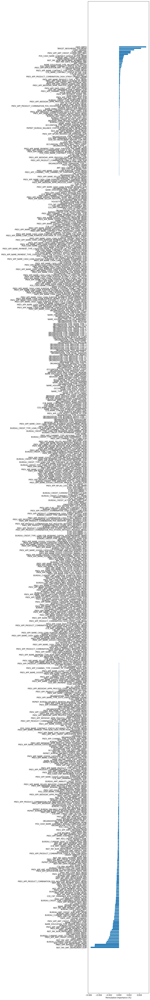

In [54]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test, y_test, figsize=(6, 100))

In [55]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_sklearn.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn.importances_mean)})

In [56]:
# Variables sans zéros importances
fs_perm_imp_sklearn = df_fs_perm_imp_sklearn[df_fs_perm_imp_sklearn[
    'Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn.shape[0]} variables sans zéro importance')

355 variables sans zéro importance


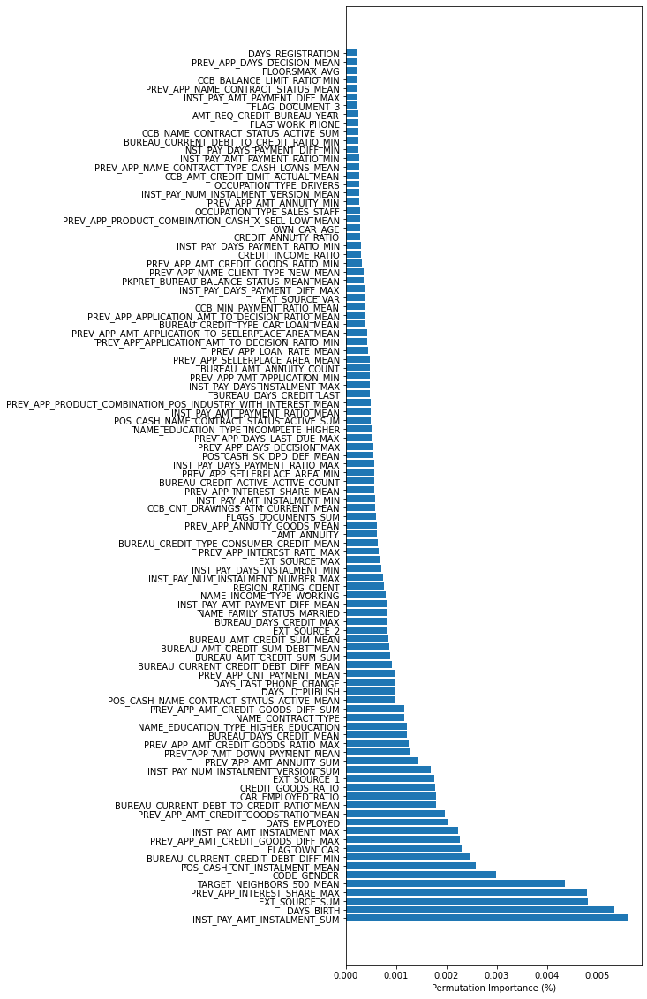

In [57]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot = \
    df_fs_perm_imp_sklearn.sort_values(by='Importance_abs',
                                       ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [58]:
df_fs_perm_imp_sklearn = pd.DataFrame(fs_perm_imp_sklearn['Variables'])
df_fs_perm_imp_sklearn.shape[0]

355

**Sauvegarde**

In [59]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/perm_imp_sklearn.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [60]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [44]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn, 'rb') as df_fs_perm_imp_sklearn:
    df_fs_perm_imp_sklearn = pickle.load(df_fs_perm_imp_sklearn)
df_fs_perm_imp_sklearn.shape

(355, 1)

In [45]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-LightGbm')

train_set - permutation-importance-LightGbm : 355 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [63]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm, X_test,
                                                          y_test)

Weight,Feature
0.0055 ± 0.0009,DAYS_BIRTH
0.0047 ± 0.0032,TARGET_NEIGHBORS_500_MEAN
0.0030 ± 0.0005,CODE_GENDER
0.0025 ± 0.0006,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX
0.0023 ± 0.0007,FLAG_OWN_CAR
0.0021 ± 0.0008,EXT_SOURCE_1
0.0010 ± 0.0005,BUREAU_AMT_CREDIT_SUM_MEAN
0.0010 ± 0.0002,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN
0.0009 ± 0.0005,INST_PAY_DAYS_INSTALMENT_MIN
0.0008 ± 0.0005,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM


In [64]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5 = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5.feature_importances_)})

In [65]:
# Variables sans zéros importances
fs_perm_imp_eli5 = df_fs_perm_imp_eli5[df_fs_perm_imp_eli5[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5.shape[0]} variables sans zéro importance')

357 variables sans zéro importance


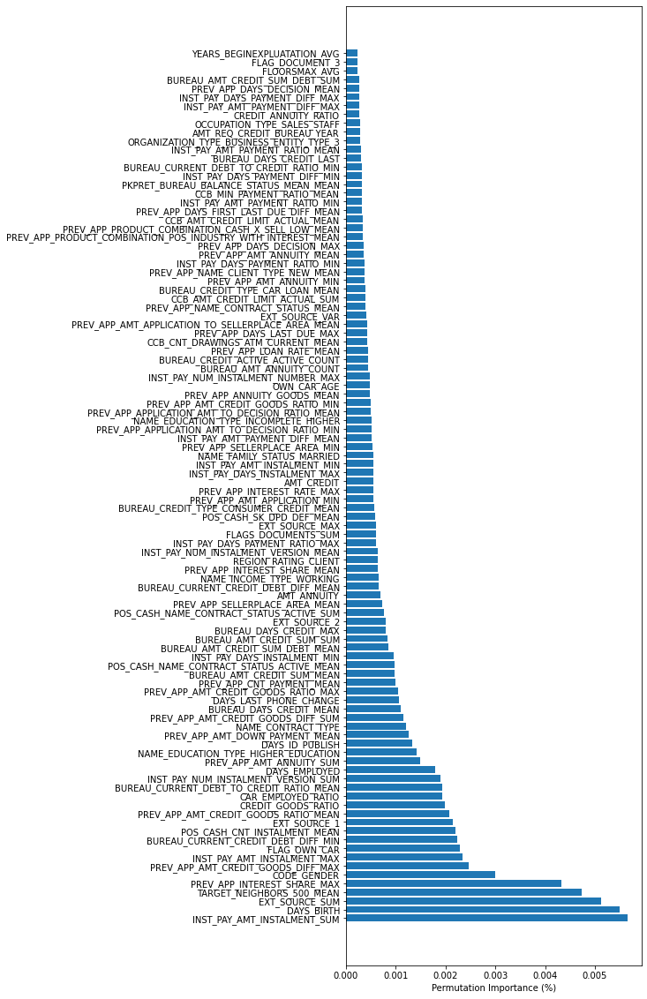

In [66]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot = \
    df_fs_perm_imp_eli5.sort_values(by='Importance_abs',
                                    ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [67]:
df_fs_perm_imp_eli5 = pd.DataFrame(fs_perm_imp_eli5['Variables'])
df_fs_perm_imp_eli5.shape[0]

357

**Sauvegarde**

In [68]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [46]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5, 'rb') as df_fs_perm_imp_eli5:
    df_fs_perm_imp_eli5 = pickle.load(df_fs_perm_imp_eli5)
df_fs_perm_imp_eli5.shape

(357, 1)

In [47]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-eli5')

train_set - permutation-importance-eli5 : 357 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [71]:
# Dataframes de travail
train_sans_fs_perm = train_set.copy()
train_sans_fs_perm = \
    train_sans_fs_perm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307507, 614)


In [72]:
# Sauvegarde des étiquettes
train_sans_fs_perm_labels = train_sans_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['SK_ID_CURR'])
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['TARGET'])

print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307507, 612)


In [73]:
# Initialisation des variables
X = train_sans_fs_perm
y = train_sans_fs_perm_labels

In [74]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [75]:
# Split en jeux d'entraînement et de validation
X_train_sans, X_test_sans, y_train_sans, y_test_sans = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_sans, y_train_sans,
         early_stopping_rounds=100,
         eval_set=[(X_test_sans, y_test_sans)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.788595	valid_0's binary_logloss: 0.504977


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

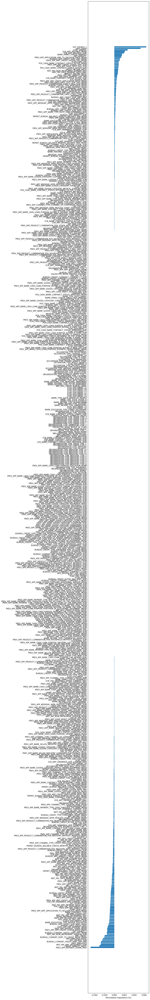

In [76]:
# Feature importance par permutation importance avec sklearn
perm_imp_sans_sklearn = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_sans, y_test_sans,
                                 figsize=(6, 100))

In [77]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_sklearn.importances_mean,
                  'Importance_abs':
                      np.abs(perm_imp_sans_sklearn.importances_mean)})

In [78]:
# Variables sans zéros importances
fs_perm_imp_sans_sklearn = df_fs_perm_imp_sans_sklearn[
    df_fs_perm_imp_sans_sklearn['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sans_sklearn.shape[0]} variables sans zéro importance')

396 variables sans zéro importance


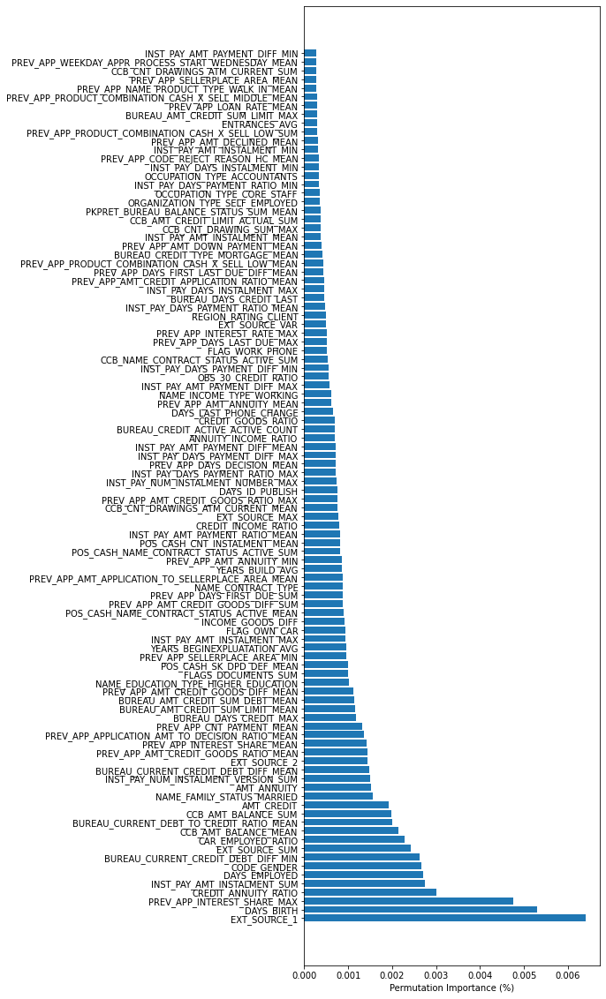

In [79]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_sklearn_plot = \
    df_fs_perm_imp_sans_sklearn.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sans_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [80]:
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame(fs_perm_imp_sans_sklearn['Variables'])
df_fs_perm_imp_sans_sklearn.shape[0]

396

**Sauvegarde**

In [81]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sans_sklearn_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/perm_imp_sans_sklearn.pickle'
with open(fic_sav_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [82]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sans_sklearn_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sans_sklearn.pickle'
with open(fic_sav_fs_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [48]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sans_sklearn = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sans_sklearn.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sans_sklearn, 'rb') as df_fs_perm_imp_ss_sklearn:
    df_fs_perm_imp_sans_sklearn = pickle.load(df_fs_perm_imp_ss_sklearn)
df_fs_perm_imp_sans_sklearn.shape

(396, 1)

In [49]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sans_sklearn,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-LightGbm')

train_sans_set - permutation-importance-LightGbm : 396 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [85]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_sans_eli5 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_sans,
                                                          y_test_sans)

Weight,Feature
0.0066 ± 0.0006,EXT_SOURCE_1
0.0055 ± 0.0004,DAYS_BIRTH
0.0030 ± 0.0003,CODE_GENDER
0.0021 ± 0.0004,CCB_AMT_BALANCE_MEAN
0.0020 ± 0.0001,CCB_AMT_BALANCE_SUM
0.0016 ± 0.0003,AMT_ANNUITY
0.0015 ± 0.0006,NAME_FAMILY_STATUS_MARRIED
0.0012 ± 0.0008,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN
0.0012 ± 0.0002,BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN
0.0012 ± 0.0004,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN


In [86]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_eli5 = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_sans_eli5.feature_importances_)})

In [87]:
# Variables sans zéros importances
df_fs_perm_imp_sans_eli5 = df_fs_perm_imp_sans_eli5[
    df_fs_perm_imp_sans_eli5['Importance_abs'] != 0.0000]
print(f'{df_fs_perm_imp_sans_eli5.shape[0]} variables sans zéro importance')

395 variables sans zéro importance


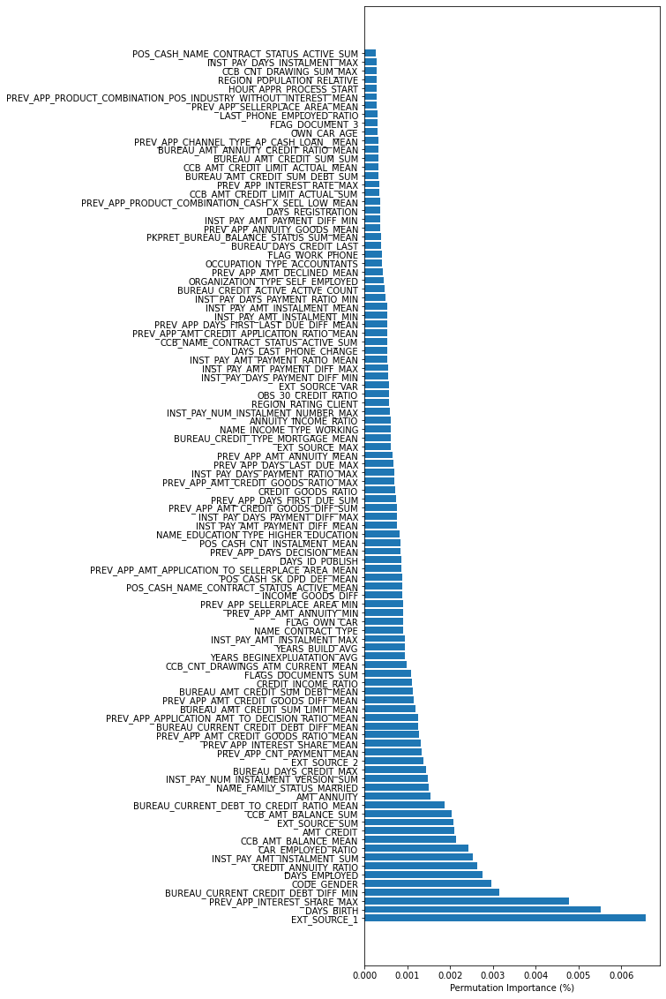

In [88]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_eli5_plot = \
    df_fs_perm_imp_sans_eli5.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_sans_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [89]:
df_fs_perm_imp_sans_eli5 = pd.DataFrame(df_fs_perm_imp_sans_eli5['Variables'])
df_fs_perm_imp_sans_eli5.shape[0]

395

**Sauvegarde**

In [90]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_sans_eli5_lgbm = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sans_eli5.pickle'
with open(fic_sav_fs_perm_imp_sans_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [50]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_sans_eli5 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sans_eli5.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sans_eli5, 'rb') as df_fs_perm_imp_sans_eli5:
    df_fs_perm_imp_sans_eli5 = pickle.load(df_fs_perm_imp_sans_eli5)
df_fs_perm_imp_sans_eli5.shape

(395, 1)

In [51]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sans_eli5,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-eli5')

train_sans_set - permutation-importance-eli5 : 395 variables importantes conservées


<span style='background:Moccasin'>**Train_imp1_set/test_imp1_set**</span>

**Préparation du dataframe de travail**

In [52]:
# Dataframes de travail
train_imp1_fs_perm = train_imp1_set.copy()
print(f'train_fs_perm : {train_imp1_fs_perm.shape}')

train_fs_perm : (307507, 622)


In [53]:
# Gestion des valeurs infinies
train_imp1_fs_perm = train_imp1_fs_perm.replace([np.inf, -np.inf], np.nan)
train_imp1_fs_perm = train_imp1_fs_perm.fillna(0)

In [54]:
# Sauvegarde des étiquettes
train_imp1_fs_perm_labels = train_imp1_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp1_fs_perm = train_imp1_fs_perm.drop(columns=['SK_ID_CURR'])
train_imp1_fs_perm = train_imp1_fs_perm.drop(columns=['TARGET'])

print(f'train_imp1_fs_perm : {train_imp1_fs_perm.shape}')

train_imp1_fs_perm : (307507, 620)


In [55]:
# Initialisation des variables
X = train_imp1_fs_perm
y = train_imp1_fs_perm_labels

In [56]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [57]:
# Split en jeux d'entraînement et de validation
X_train_imp1, X_test_imp1, y_train_imp1, y_test_imp1 = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_imp1, y_train_imp1,
         early_stopping_rounds=100,
         eval_set=[(X_test_imp1, y_test_imp1)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.792625	valid_0's binary_logloss: 0.501877


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

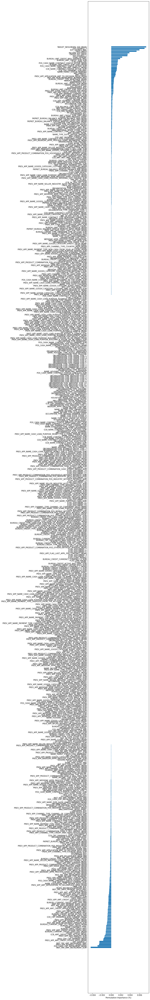

In [58]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn_imp1 = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_imp1, y_test_imp1,
                                 figsize=(6, 100))

In [59]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn_imp1 = \
    pd.DataFrame({'Variables': X_test_imp1.columns,
                  'Importance': perm_imp_sklearn_imp1.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn_imp1
                                           .importances_mean)})

In [60]:
# Variables sans zéros importances
fs_perm_imp_sklearn_imp1 = df_fs_perm_imp_sklearn_imp1[
    df_fs_perm_imp_sklearn_imp1['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn_imp1.shape[0]} variables sans zéro importance')

388 variables sans zéro importance


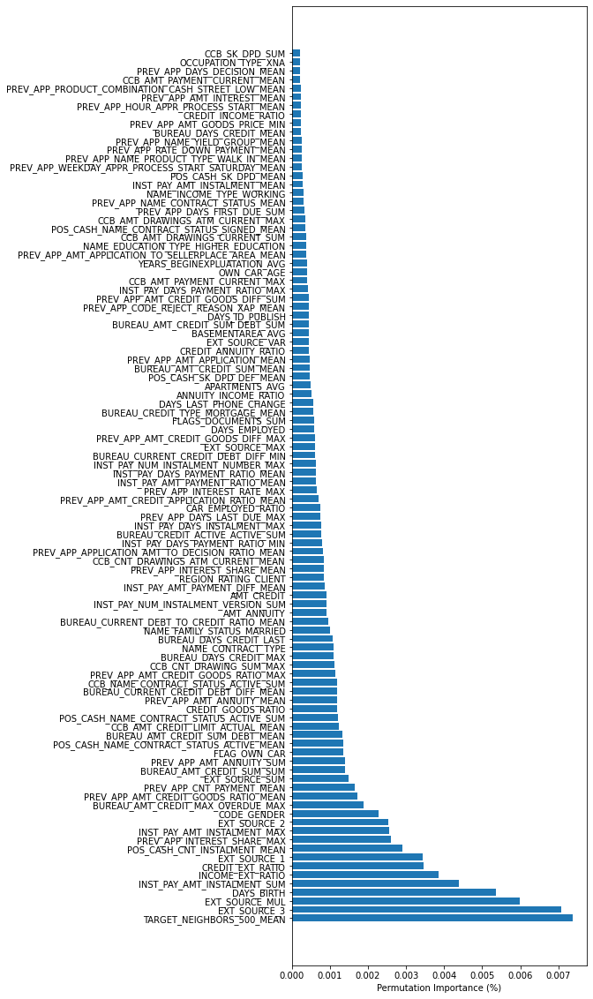

In [61]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot_imp1 = \
    df_fs_perm_imp_sklearn_imp1.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot_imp1['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot_imp1['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [62]:
df_fs_perm_imp_sklearn_imp1 = \
    pd.DataFrame(fs_perm_imp_sklearn_imp1['Variables'])
df_fs_perm_imp_sklearn_imp1.shape[0]

388

**Sauvegarde**

In [63]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm_imp1 = \
    '/content/drive/My Drive/sauvegarde/features-selection/perm_imp_sklearn_imp1.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm_imp1, 'wb') as f:
    pickle.dump(perm_imp_sklearn_imp1, f, pickle.HIGHEST_PROTOCOL)

In [64]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm_imp1 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn_imp1.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm_imp1, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn_imp1, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [65]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn_imp1 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn_imp1.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn_imp1,
          'rb') as df_fs_perm_imp_sklearn_imp1:
    df_fs_perm_imp_sklearn_imp1 = pickle.load(df_fs_perm_imp_sklearn_imp1)
df_fs_perm_imp_sklearn_imp1.shape

(388, 1)

In [66]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn_imp1,
                                df_fs_train_imp1_set,
                                'train_imp1_set',
                                'permutation-importance-LightGbm')

train_imp1_set - permutation-importance-LightGbm : 388 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [67]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5_imp1 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_imp1,
                                                          y_test_imp1)

Weight,Feature
0.0079 ± 0.0016,TARGET_NEIGHBORS_500_MEAN
0.0072 ± 0.0004,EXT_SOURCE_3
0.0061 ± 0.0004,EXT_SOURCE_MUL
0.0058 ± 0.0007,DAYS_BIRTH
0.0038 ± 0.0006,INCOME_EXT_RATIO
0.0034 ± 0.0007,EXT_SOURCE_1
0.0031 ± 0.0007,CREDIT_EXT_RATIO
0.0025 ± 0.0010,CODE_GENDER
0.0017 ± 0.0004,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX
0.0015 ± 0.0003,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM


In [68]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5_imp1 = \
    pd.DataFrame({'Variables': X_test_imp1.columns,
                  'Importance': perm_imp_eli5_imp1.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5_imp1.feature_importances_)})

In [69]:
# Variables sans zéros importances
fs_perm_imp_eli5_imp1 = df_fs_perm_imp_eli5_imp1[df_fs_perm_imp_eli5_imp1[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5_imp1.shape[0]} variables sans zéro importance')

387 variables sans zéro importance


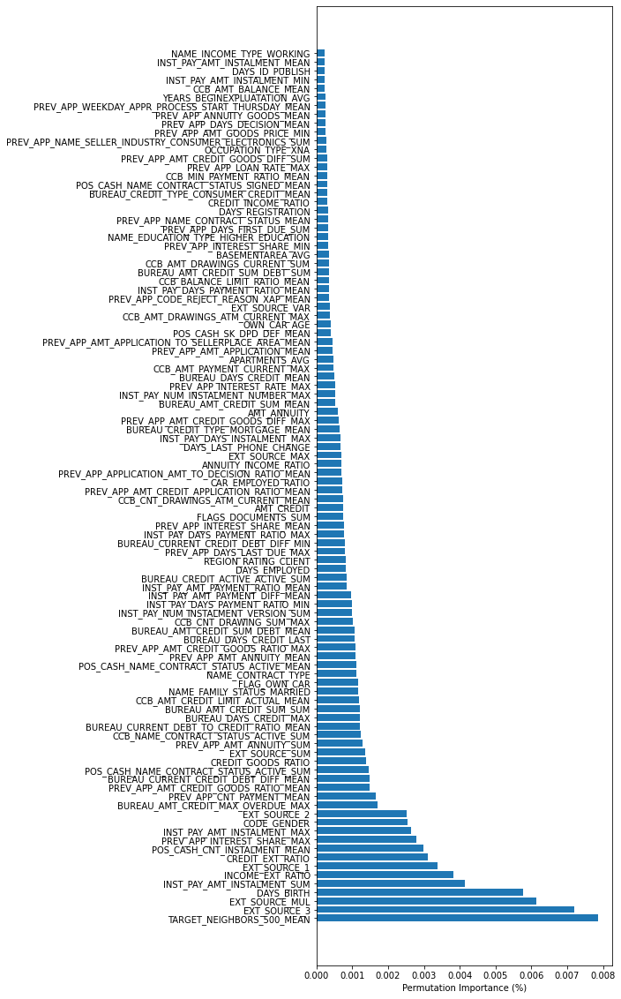

In [70]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot_imp1 = \
    df_fs_perm_imp_eli5_imp1.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot_imp1['Variables'].head(100),
         df_fs_perm_imp_eli5_plot_imp1['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [71]:
df_fs_perm_imp_eli5_imp1 = \
    pd.DataFrame(fs_perm_imp_eli5_imp1['Variables'])
df_fs_perm_imp_eli5_imp1.shape[0]

387

**Sauvegarde**

In [72]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm_imp1 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5_imp1.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm_imp1, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5_imp1, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [73]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5_imp1 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5_imp1.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5_imp1, 'rb') as df_fs_perm_imp_eli5_imp1:
    df_fs_perm_imp_eli5_imp1 = pickle.load(df_fs_perm_imp_eli5_imp1)
df_fs_perm_imp_eli5_imp1.shape

(387, 1)

In [74]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5_imp1,
                                df_fs_train_imp1_set,
                                'train_imp1_set',
                                'permutation-importance-eli5')

train_imp1_set - permutation-importance-eli5 : 387 variables importantes conservées


<span style='background:Moccasin'>**Train_imp2_set/test_imp2_set**</span>

**Préparation du dataframe de travail**

In [75]:
# Dataframes de travail
train_imp2_fs_perm = train_imp2_set.copy()
print(f'train_imp2_fs_perm : {train_imp2_fs_perm.shape}')

train_imp2_fs_perm : (307507, 612)


In [76]:
# Sauvegarde des étiquettes
train_imp2_fs_perm_labels = train_imp2_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp2_fs_perm = train_imp2_fs_perm.drop(columns=['SK_ID_CURR'])
train_imp2_fs_perm = train_imp2_fs_perm.drop(columns=['TARGET'])

print(f'train_imp2_fs_perm : {train_imp2_fs_perm.shape}')

train_imp2_fs_perm : (307507, 610)


In [77]:
# Initialisation des variables
X = train_imp2_fs_perm
y = train_imp2_fs_perm_labels

In [78]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [79]:
# Split en jeux d'entraînement et de validation
X_train_imp2, X_test_imp2, y_train_imp2, y_test_imp2 = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_imp2, y_train_imp2,
         early_stopping_rounds=100,
         eval_set=[(X_test_imp2, y_test_imp2)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.796106	valid_0's binary_logloss: 0.500967


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

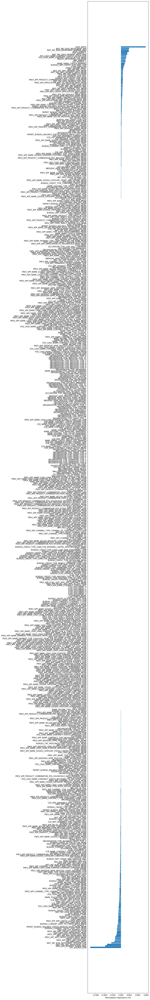

In [80]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn_imp2 = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_imp2, y_test_imp2,
                                 figsize=(6, 100))

In [81]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn_imp2 = \
    pd.DataFrame({'Variables': X_test_imp2.columns,
                  'Importance': perm_imp_sklearn_imp2.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn_imp2
                                           .importances_mean)})

In [82]:
# Variables sans zéros importances
fs_perm_imp_sklearn_imp2 = df_fs_perm_imp_sklearn_imp2[
    df_fs_perm_imp_sklearn_imp2['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn_imp2.shape[0]} variables sans zéro importance')

338 variables sans zéro importance


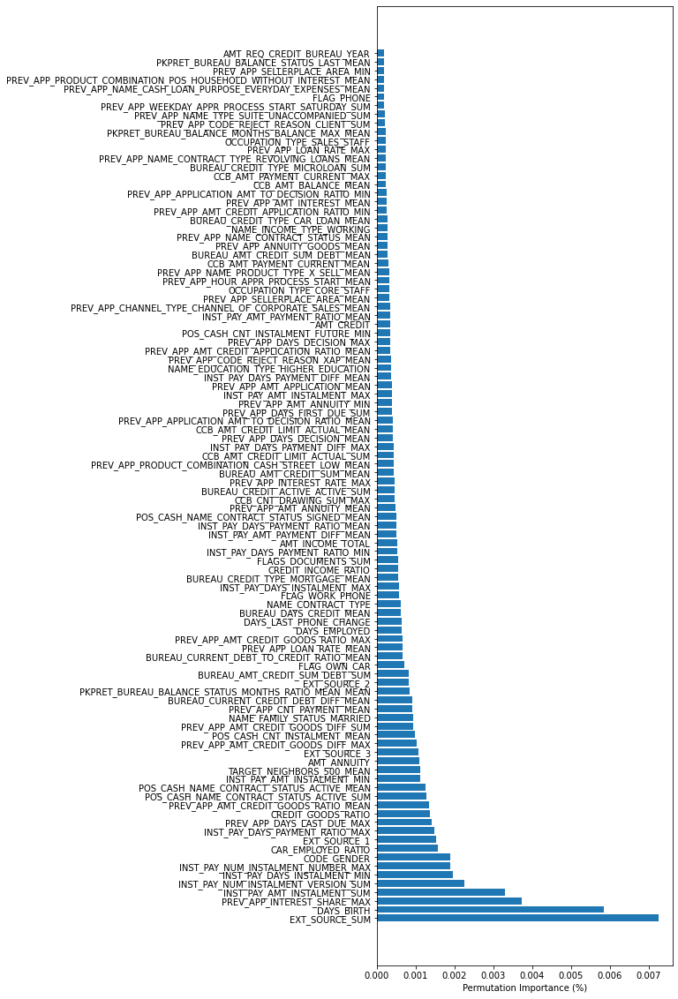

In [83]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot_imp2 = \
    df_fs_perm_imp_sklearn_imp2.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot_imp2['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot_imp2['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [84]:
df_fs_perm_imp_sklearn_imp2 = \
    pd.DataFrame(fs_perm_imp_sklearn_imp2['Variables'])
df_fs_perm_imp_sklearn_imp2.shape[0]

338

**Sauvegarde**

In [85]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm_imp2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/perm_imp_sklearn_imp2.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm_imp2, 'wb') as f:
    pickle.dump(perm_imp_sklearn_imp2, f, pickle.HIGHEST_PROTOCOL)

In [86]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm_imp2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn_imp2.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm_imp2, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn_imp2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [87]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn_imp2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_sklearn_imp2.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn_imp2, 'rb') as df_fs_permimpsklearn_imp2:
    df_fs_perm_imp_sklearn_imp2 = pickle.load(df_fs_permimpsklearn_imp2)
df_fs_perm_imp_sklearn_imp2.shape

(338, 1)

In [88]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn_imp2,
                                df_fs_train_imp2_set,
                                'train_imp2_set',
                                'permutation-importance-LightGbm')

train_imp2_set - permutation-importance-LightGbm : 338 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [89]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5_imp2 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_imp2,
                                                          y_test_imp2)

Weight,Feature
0.0055 ± 0.0002,DAYS_BIRTH
0.0020 ± 0.0002,INST_PAY_NUM_INSTALMENT_NUMBER_MAX
0.0020 ± 0.0008,INST_PAY_DAYS_INSTALMENT_MIN
0.0018 ± 0.0008,INST_PAY_DAYS_PAYMENT_RATIO_MAX
0.0017 ± 0.0004,EXT_SOURCE_1
0.0016 ± 0.0006,AMT_ANNUITY
0.0016 ± 0.0002,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM
0.0013 ± 0.0003,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN
0.0012 ± 0.0010,CODE_GENDER
0.0012 ± 0.0007,NAME_FAMILY_STATUS_MARRIED


In [90]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5_imp2 = \
    pd.DataFrame({'Variables': X_test_imp2.columns,
                  'Importance': perm_imp_eli5_imp2.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5_imp2.feature_importances_)})

In [91]:
# Variables sans zéros importances
fs_perm_imp_eli5_imp2 = df_fs_perm_imp_eli5_imp2[df_fs_perm_imp_eli5_imp2[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5_imp2.shape[0]} variables sans zéro importance')

338 variables sans zéro importance


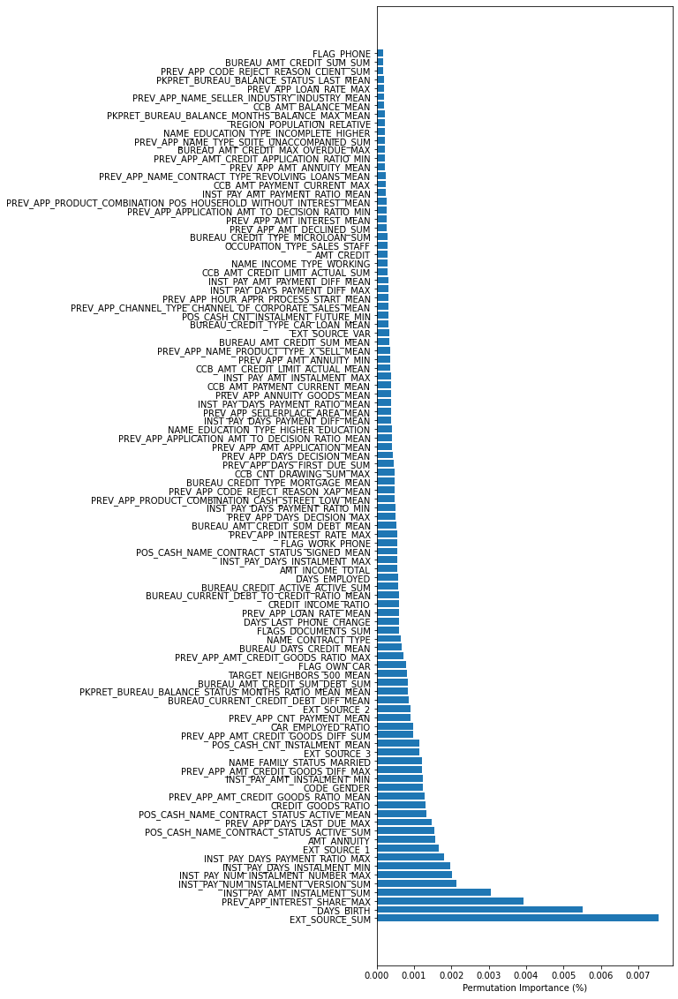

In [92]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot_imp2 = \
    df_fs_perm_imp_eli5_imp2.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot_imp2['Variables'].head(100),
         df_fs_perm_imp_eli5_plot_imp2['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [93]:
df_fs_perm_imp_eli5_imp2 = \
    pd.DataFrame(fs_perm_imp_eli5_imp2['Variables'])
df_fs_perm_imp_eli5_imp2.shape[0]

338

**Sauvegarde**

In [94]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm_imp2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5_imp2.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm_imp2, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5_imp2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [95]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5_imp2 = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_perm_imp_eli5_imp2.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5_imp2, 'rb') as df_fs_perm_imp_eli5_imp2:
    df_fs_perm_imp_eli5_imp2 = pickle.load(df_fs_perm_imp_eli5_imp2)
df_fs_perm_imp_eli5_imp2.shape

(338, 1)

In [96]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5_imp2,
                                df_fs_train_imp2_set,
                                'train_imp2_set',
                                'permutation-importance-eli5')

train_imp2_set - permutation-importance-eli5 : 338 variables importantes conservées


### <span style='background:PowderBlue'>3.5. Features selection : RFECV</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [97]:
# Estimateur de RFECV
estimator = lgb.LGBMClassifier(random_state=21)

In [98]:
fs_rfecv_train_set = \
    outils_preprocessing.calcul_plot_rfecv(estimator, X_train, y_train,
                                           figsize=(8, 50))

NameError: ignored

In [99]:
fs_rfecv = ['NAME_CONTRACT_TYPE',
            'CODE_GENDER',
            'FLAG_OWN_CAR',
            'AMT_INCOME_TOTAL',
            'AMT_CREDIT',
            'AMT_ANNUITY',
            'REGION_POPULATION_RELATIVE',
            'DAYS_BIRTH',
            'DAYS_EMPLOYED',
            'DAYS_REGISTRATION',
            'DAYS_ID_PUBLISH',
            'OWN_CAR_AGE',
            'FLAG_WORK_PHONE',
            'REGION_RATING_CLIENT',
            'HOUR_APPR_PROCESS_START',
            'REG_CITY_NOT_LIVE_CITY',
            'EXT_SOURCE_1',
            'EXT_SOURCE_2',
            'EXT_SOURCE_3',
            'APARTMENTS_AVG',
            'BASEMENTAREA_AVG',
            'YEARS_BEGINEXPLUATATION_AVG',
            'YEARS_BUILD_AVG',
            'ENTRANCES_AVG',
            'FLOORSMAX_AVG',
            'LANDAREA_AVG',
            'OBS_30_CNT_SOCIAL_CIRCLE',
            'DEF_30_CNT_SOCIAL_CIRCLE',
            'DAYS_LAST_PHONE_CHANGE',
            'FLAG_DOCUMENT_8',
            'CREDIT_INCOME_RATIO',
            'CREDIT_ANNUITY_RATIO',
            'ANNUITY_INCOME_RATIO',
            'CREDIT_GOODS_RATIO',
            'INCOME_GOODS_DIFF',
            'INCOME_EXT_RATIO',
            'LAST_PHONE_EMPLOYED_RATIO',
            'CAR_EMPLOYED_RATIO',
            'EXT_SOURCE_SUM',
            'EXT_SOURCE_MAX',
            'EXT_SOURCE_VAR',
            'OBS_DEF_30_MUL',
            'OBS_30_CREDIT_RATIO',
            'FLAGS_DOCUMENTS_SUM',
            'ENQ_CREDIT_RATIO',
            'TARGET_NEIGHBORS_500_MEAN',
            'NAME_INCOME_TYPE_WORKING',
            'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
            'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
            'NAME_FAMILY_STATUS_MARRIED',
            'OCCUPATION_TYPE_CORE_STAFF',
            'OCCUPATION_TYPE_DRIVERS',
            'OCCUPATION_TYPE_SALES_STAFF',
            'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
            'ORGANIZATION_TYPE_CONSTRUCTION',
            'ORGANIZATION_TYPE_MILITARY',
            'ORGANIZATION_TYPE_SELF_EMPLOYED',
            'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
            'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'CCB_AMT_BALANCE_MEAN',
            'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
            'CCB_AMT_DRAWINGS_OTHER_CURRENT_SUM',
            'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
            'CCB_AMT_PAYMENT_CURRENT_MEAN',
            'CCB_AMT_PAYMENT_CURRENT_MAX',
            'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
            'CCB_CNT_DRAWINGS_CURRENT_SUM',
            'CCB_SK_DPD_SUM',
            'CCB_BALANCE_LIMIT_RATIO_MEAN',
            'CCB_BALANCE_LIMIT_RATIO_MIN',
            'CCB_CNT_DRAWING_SUM_MAX',
            'CCB_MIN_PAYMENT_RATIO_MEAN',
            'CCB_PAYMENT_MIN_DIFF_MIN',
            'CCB_AMT_INTEREST_RECEIVABLE_MIN',
            'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
            'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
            'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
            'INST_PAY_DAYS_INSTALMENT_MAX',
            'INST_PAY_DAYS_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MEAN',
            'INST_PAY_AMT_INSTALMENT_SUM',
            'INST_PAY_AMT_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MAX',
            'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
            'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
            'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MAX',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
            'POS_CASH_CNT_INSTALMENT_MEAN',
            'POS_CASH_CNT_INSTALMENT_MIN',
            'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
            'POS_CASH_SK_DPD_MEAN',
            'POS_CASH_SK_DPD_DEF_MEAN',
            'POS_CASH_TOTAL_TERM_LAST',
            'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
            'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
            'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
            'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
            'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
            'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
            'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
            'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
            'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
            'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
            'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
            'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
            'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
            'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
            'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
            'PREV_APP_AMT_ANNUITY_MEAN',
            'PREV_APP_AMT_ANNUITY_SUM',
            'PREV_APP_AMT_ANNUITY_MIN',
            'PREV_APP_AMT_APPLICATION_MEAN',
            'PREV_APP_AMT_APPLICATION_MIN',
            'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
            'PREV_APP_AMT_GOODS_PRICE_MIN',
            'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
            'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
            'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
            'PREV_APP_DAYS_DECISION_MEAN',
            'PREV_APP_DAYS_DECISION_MAX',
            'PREV_APP_SELLERPLACE_AREA_MEAN',
            'PREV_APP_CNT_PAYMENT_MEAN',
            'PREV_APP_NAME_YIELD_GROUP_MEAN',
            'PREV_APP_DAYS_FIRST_DUE_SUM',
            'PREV_APP_DAYS_LAST_DUE_MAX',
            'PREV_APP_AMT_DECLINED_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
            'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
            'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
            'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
            'PREV_APP_ANNUITY_MEAN',
            'PREV_APP_ANNUITY_GOODS_MEAN',
            'PREV_APP_LOAN_RATE_MAX',
            'PREV_APP_LOAN_RATE_MEAN',
            'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
            'PREV_APP_AMT_INTEREST_MEAN',
            'PREV_APP_INTEREST_SHARE_MEAN',
            'PREV_APP_INTEREST_SHARE_MAX',
            'PREV_APP_INTEREST_SHARE_MIN',
            'PREV_APP_INTEREST_RATE_MAX',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
            'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
            'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
            'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
            'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
            'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
            'BUREAU_DAYS_CREDIT_MEAN',
            'BUREAU_DAYS_CREDIT_MAX',
            'BUREAU_DAYS_CREDIT_LAST',
            'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
            'BUREAU_AMT_CREDIT_SUM_MEAN',
            'BUREAU_AMT_CREDIT_SUM_SUM',
            'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
            'BUREAU_AMT_ANNUITY_SUM',
            'BUREAU_AMT_ANNUITY_COUNT',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
            'BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN']

In [100]:
df_fs_rfecv = pd.DataFrame(fs_rfecv)
df_fs_rfecv.shape[0]

204

**Sauvegarde**

In [101]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_rfecv.pickle'
with open(fic_sav_fs_rfecv, 'wb') as f:
    pickle.dump(df_fs_rfecv, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [102]:
# Chargement des features importance de RFECV
fic_sav_fs_rfecv = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_rfecv.pickle'
# Chargement des features importance
with open(fic_sav_fs_rfecv, 'rb') as df_fs_rfecv:
    df_fs_rfecv = pickle.load(df_fs_rfecv)
df_fs_rfecv.shape

(204, 1)

In [103]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_rfecv,
                                df_fs_train_set,
                                'train_set',
                                'RFECV')

train_set - RFECV : 204 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [104]:
# Estimateur de RFECV
estimator_sans = lgb.LGBMClassifier(random_state=21)

In [105]:
fs_rfecv_sans_train_set = \
    outils_preprocessing.calcul_plot_rfecv(estimator_sans,
                                           X_train_sans,
                                           y_train_sans,
                                           figsize=(8, 50))

NameError: ignored

In [106]:
fs_rfecv_sans = [
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'NONLIVINGAREA_AVG',
 'EMERGENCYSTATE_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CREDIT_INCOME_RATIO',
 'CREDIT_ANNUITY_RATIO',
 'ANNUITY_INCOME_RATIO',
 'CREDIT_GOODS_RATIO',
 'INCOME_GOODS_DIFF',
 'INCOME_EXT_RATIO',
 'LAST_PHONE_EMPLOYED_RATIO',
 'CAR_EMPLOYED_RATIO',
 'FLAG_CONTACTS_SUM',
 'CNT_NON_CHILDREN',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_VAR',
 'OBS_DEF_30_MUL',
 'OBS_30_CREDIT_RATIO',
 'FLAGS_DOCUMENTS_SUM',
 'ENQ_CREDIT_RATIO',
 'NAME_TYPE_SUITE_CHILDREN',
 'NAME_TYPE_SUITE_OTHER_B',
 'NAME_INCOME_TYPE_BUSINESSMAN',
 'NAME_INCOME_TYPE_STATE_SERVANT',
 'NAME_INCOME_TYPE_WORKING',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
 'NAME_FAMILY_STATUS_CIVIL_MARRIAGE',
 'NAME_FAMILY_STATUS_MARRIED',
 'NAME_FAMILY_STATUS_SEPARATED',
 'NAME_FAMILY_STATUS_SINGLE_NOT_MARRIED',
 'NAME_HOUSING_TYPE_HOUSE_APARTMENT',
 'OCCUPATION_TYPE_ACCOUNTANTS',
 'OCCUPATION_TYPE_CLEANING_STAFF',
 'OCCUPATION_TYPE_CORE_STAFF',
 'OCCUPATION_TYPE_DRIVERS',
 'OCCUPATION_TYPE_LOW_SKILL_LABORERS',
 'OCCUPATION_TYPE_MANAGERS',
 'OCCUPATION_TYPE_MEDICINE_STAFF',
 'OCCUPATION_TYPE_SALES_STAFF',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
 'ORGANIZATION_TYPE_CONSTRUCTION',
 'ORGANIZATION_TYPE_CULTURE',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_7',
 'ORGANIZATION_TYPE_KINDERGARTEN',
 'ORGANIZATION_TYPE_MEDICINE',
 'ORGANIZATION_TYPE_MILITARY',
 'ORGANIZATION_TYPE_REALTOR',
 'ORGANIZATION_TYPE_SCHOOL',
 'ORGANIZATION_TYPE_SELF_EMPLOYED',
 'ORGANIZATION_TYPE_TRADE_TYPE_3',
 'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
 'HOUSETYPE_MODE_SPECIFIC_HOUSING',
 'WALLSMATERIAL_MODE_MIXED',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'CCB_AMT_BALANCE_SUM',
 'CCB_AMT_BALANCE_MEAN',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_MEAN',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
 'CCB_AMT_INST_MIN_REGULARITY_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MEAN',
 'CCB_AMT_PAYMENT_CURRENT_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'CCB_CNT_DRAWINGS_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_MAX',
 'CCB_SK_DPD_SUM',
 'CCB_SK_DPD_DEF_SUM',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MIN',
 'CCB_CNT_DRAWING_SUM_MAX',
 'CCB_MIN_PAYMENT_RATIO_MEAN',
 'CCB_PAYMENT_MIN_DIFF_MIN',
 'CCB_AMT_INTEREST_RECEIVABLE_MIN',
 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MEAN',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MAX',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_COMPLETED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_DEMAND_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_XNA_SUM',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'POS_CASH_CNT_INSTALMENT_MIN',
 'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
 'POS_CASH_SK_DPD_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'POS_CASH_TOTAL_TERM_LAST',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_MEAN',
 'PREV_APP_NAME_CONTRACT_TYPE_CONSUMER_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY_SUM',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_PAYMENTS_ON_OTHER_LOANS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_REPAIRS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_URGENT_NEEDS_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_XNA_SUM',
 'PREV_APP_CODE_REJECT_REASON_CLIENT_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_SUM',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCO_SUM',
 'PREV_APP_CODE_REJECT_REASON_SCO_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
 'PREV_APP_CODE_REJECT_REASON_VERIF_SUM',
 'PREV_APP_CODE_REJECT_REASON_VERIF_MEAN',
 'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_CHILDREN_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_GROUP_OF_PEOPLE_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_SUM',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_NEW_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ANIMALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_AUTO_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_COMPUTERS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICAL_SUPPLIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICINE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_OTHER_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_SPORT_AND_LEISURE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_TOURISM_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_VEHICLES_MEAN',
 'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_SUM',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__SUM',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
 'PREV_APP_CHANNEL_TYPE_CHANNEL_OF_CORPORATE_SALES_MEAN',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_SUM',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_MEAN',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_MEAN',
 'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
 'PREV_APP_CHANNEL_TYPE_STONE_SUM',
 'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_AUTO_TECHNOLOGY_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_ANNUITY_SUM',
 'PREV_APP_AMT_ANNUITY_MIN',
 'PREV_APP_AMT_APPLICATION_MEAN',
 'PREV_APP_AMT_APPLICATION_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_AMT_GOODS_PRICE_MIN',
 'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
 'PREV_APP_FLAG_LAST_APPL_PER_CONTRACT_MEAN',
 'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_LAST',
 'PREV_APP_DAYS_DECISION_MEAN',
 'PREV_APP_DAYS_DECISION_MAX',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MIN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_LAST',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM',
 'PREV_APP_AMT_DECLINED_MEAN',
 'PREV_APP_AMT_DECLINED_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN',
 'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
 'PREV_APP_ANNUITY_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'PREV_APP_LOAN_RATE_MAX',
 'PREV_APP_LOAN_RATE_MEAN',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'PREV_APP_AMT_INTEREST_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_INTEREST_SHARE_MAX',
 'PREV_APP_INTEREST_SHARE_MIN',
 'PREV_APP_INTEREST_RATE_MAX',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
 'BUREAU_CREDIT_ACTIVE_SOLD_SUM',
 'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM',
 'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
 'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
 'BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_BUSINESS_DEVELOPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_PURCHASE_OF_SHARES_MARGIN_LENDING__SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_MEAN',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_MEAN',
 'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
 'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
 'BUREAU_CREDIT_TYPE_MOBILE_OPERATOR_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'BUREAU_DAYS_CREDIT_MAX',
 'BUREAU_DAYS_CREDIT_LAST',
 'BUREAU_CREDIT_DAY_OVERDUE_MEAN',
 'BUREAU_CREDIT_DAY_OVERDUE_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'BUREAU_CNT_CREDIT_PROLONG_MAX',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
 'BUREAU_AMT_ANNUITY_SUM',
 'BUREAU_AMT_ANNUITY_COUNT',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM',
 'BUREAU_CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN']

In [107]:
df_fs_rfecv_sans = pd.DataFrame(fs_rfecv_sans)
df_fs_rfecv_sans.shape[0]

382

**Sauvegarde**

In [108]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv_sans = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_rfecv_sans.pickle'
with open(fic_sav_fs_rfecv_sans, 'wb') as f:
    pickle.dump(df_fs_rfecv_sans, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [109]:
# Chargement des features importance de RFECV
fic_sav_fs_rfecv_sans = \
    '/content/drive/My Drive/sauvegarde/features-selection/fs_rfecv_sans.pickle'
# Chargement des features importance
with open(fic_sav_fs_rfecv_sans, 'rb') as df_fs_rfecv_sans:
    df_fs_rfecv_sans = pickle.load(df_fs_rfecv_sans)
df_fs_rfecv_sans.shape

(382, 1)

In [110]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_rfecv_sans,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'RFECV')

train_sans_set - RFECV : 382 variables importantes conservées


### <span style='background:PowderBlue'>3.6. Bilan - Jeux de données finaux</span>

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_lightgbm,
- [x] df_fs_boruta,
- [x] df_fs_boruta_lgbm,
- [x] df_fs_boruta_lgbm2,
- [x] df_fs_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn,
- [x] df_fs_perm_imp_eli5,
- [x] df_fs_rfecv.

**Répétitions des variables conservées**

In [111]:
# Récupération des variables conservées pour chaque feature selection
liste_var = df_fs_lightgbm['feature'].to_list()
print(len(liste_var))
liste_var.extend(df_fs_boruta[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_boruta_lgbm[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_boruta_lgbm2[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_borshap_lgbm[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_perm_imp_sklearn['Variables'].to_list())
print(len(liste_var))
liste_var.extend(df_fs_perm_imp_eli5['Variables'].to_list())
print(len(liste_var))
liste_var.extend(df_fs_rfecv[0].to_list())
print(len(liste_var))

386
616
720
830
900
1255
1612
1816


In [112]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var = Counter(liste_var)
len(dico_nbre_repet_var)

423

In [113]:
df_nbr_repet_var = pd.DataFrame.from_dict(dico_nbre_repet_var,
                                          orient='index',
                                          columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
df_nbr_repet_var.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,8
PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,8
PREV_APP_AMT_ANNUITY_MIN,8
INST_PAY_DAYS_PAYMENT_DIFF_MIN,8
INST_PAY_AMT_INSTALMENT_MIN,8
PREV_APP_AMT_ANNUITY_MEAN,8
NAME_INCOME_TYPE_WORKING,8
PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,8
INST_PAY_DAYS_INSTALMENT_MAX,8
INST_PAY_NUM_INSTALMENT_VERSION_SUM,8


In [114]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
outils_data.distribution_variables_plages(df_nbr_repet_var,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",56,13.2388
"(1, 2]",40,9.4563
"(2, 3]",82,19.3853
"(3, 4]",67,15.8392
"(4, 5]",68,16.0757
"(5, 6]",12,2.8369
"(6, 7]",30,7.0922
"(7, 8]",68,16.0757


In [115]:
# Les variables présentes plus de 6 fois pour les 8 méthodes de feature
#  sélection seront conservées
var_cons_train_set = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 6][
        'Variables'].to_list()
print(f'{len(var_cons_train_set)} variables conservées pour le train_set')
var_cons_train_set

98 variables conservées pour le train_set


['TARGET_NEIGHBORS_500_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'CREDIT_INCOME_RATIO',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'ENQ_CREDIT_RATIO',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'EXT_SOURCE_MAX',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'FLAG_OWN_CAR',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'REGION_RATING_CLIENT',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'NAME_FAMILY_STATUS_MARRIED',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_A

In [116]:
# Sauvegarde des variables conservées pour le train_set
fic_sav_var_cons_train_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set.pickle'
with open(fic_sav_var_cons_train_set, 'wb') as f:
    pickle.dump(var_cons_train_set, f, pickle.HIGHEST_PROTOCOL)

In [117]:
# Chargement des variables conservées pour le train_set
fic_sav_var_cons_train_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set.pickle'
with open(fic_sav_var_cons_train_set, 'rb') as df_var_cons_train_set:
    var_cons_train_set = pickle.load(df_var_cons_train_set)
len(var_cons_train_set)

98

**Test en ne conservant que les variables les plus sélectionnées par feature selection**

In [118]:
# Les variables présentes plus de 6 fois pour les 8 méthodes de feature
#  sélection seront conservées
var_cons_train_set_small = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 7][
        'Variables'].to_list()
print(f'{len(var_cons_train_set_small)} variables conservées pour le train_set')
var_cons_train_set_small

68 variables conservées pour le train_set


['TARGET_NEIGHBORS_500_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'CREDIT_INCOME_RATIO',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'ENQ_CREDIT_RATIO',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'EXT_SOURCE_MAX',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'FLAG_OWN_CAR',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'REGION_RATING_CLIENT',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'NAME_FAMILY_STATUS_MARRIED',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_A

In [119]:
# Sauvegarde des variables conservées pour le train_set réduit
fic_sav_var_cons_train_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_small.pickle'
with open(fic_sav_var_cons_train_set_small, 'wb') as f:
    pickle.dump(var_cons_train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [120]:
# Chargement des variables conservées pour le train_set réduit
fic_sav_var_cons_train_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_small.pickle'
with open(fic_sav_var_cons_train_set_small, 'rb') as df_var_cons_train_set_small:
    var_cons_train_set_small = pickle.load(df_var_cons_train_set_small)
len(var_cons_train_set_small)

68

**Constitution des dataframes train_set et test_set finaux**

In [121]:
# Constitution du train_set
print(f'{train_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_avec_target_id.extend(var_cons_train_set)
train_set = train_set[var_cons_train_set_avec_target_id]
print(f'{train_set.shape}')

(307507, 615)
(307507, 100)


In [122]:
# Constitution du test_set
print(f'{test_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_avec_id = ['SK_ID_CURR']
var_cons_train_set_avec_id.extend(var_cons_train_set)
test_set = test_set[var_cons_train_set_avec_id]
print(f'{test_set.shape}')

(48744, 614)
(48744, 99)


In [123]:
# Constitution du train_set réduit
train_set_small = train_set.copy()
print(f'{train_set_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_small_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_small_avec_target_id.extend(var_cons_train_set_small)
train_set_small = train_set_small[var_cons_train_set_small_avec_target_id]
print(f'{train_set_small.shape}')

(307507, 100)
(307507, 70)


In [124]:
# Constitution du test_set réduit
test_set_small = test_set.copy()
print(f'{test_set_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_small_avec_id = ['SK_ID_CURR']
var_cons_train_set_small_avec_id.extend(var_cons_train_set_small)
test_set_small = test_set_small[var_cons_train_set_small_avec_id]
print(f'{test_set_small.shape}')

(48744, 99)
(48744, 69)


**Sauvegarde**

In [125]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set.pickle'
with open(fic_sav_train_set, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [126]:
# Export en fichier .csv
train_set.to_csv('train_set.csv', index=False)

In [127]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set.pickle'
with open(fic_sav_test_set, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [128]:
# Export en fichier .csv
test_set.to_csv('test_set.csv', index=False)

In [129]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_small.pickle'
with open(fic_sav_train_set_small, 'wb') as f:
    pickle.dump(train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [130]:
# Export en fichier .csv
train_set_small.to_csv('train_set_small.csv', index=False)

In [131]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_small.pickle'
with open(fic_sav_test_set_small, 'wb') as f:
    pickle.dump(test_set_small, f, pickle.HIGHEST_PROTOCOL)

In [132]:
# Export en fichier .csv
test_set_small.to_csv('test_set_small.csv', index=False)

**Chargement**

In [133]:
# Chargement du train_set
fic_sav_train_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_small.pickle'
with open(fic_sav_train_set_small, 'rb') as df_train_set_small:
    train_set_small = pickle.load(df_train_set_small)
train_set_small.shape

(307507, 70)

In [134]:
# Chargement du test_set
fic_sav_test_set_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_small.pickle'
with open(fic_sav_test_set_small, 'rb') as df_test_set_small:
    test_set_small = pickle.load(df_test_set_small)
test_set_small.shape

(48744, 69)

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_sans_lightgbm,
- [x] df_fs_sans_boruta_lgbm,
- [x] df_fs_sans_borshap_lgbm,
- [x] df_fs_perm_imp_sans_sklearn,
- [x] df_fs_perm_imp_sans_eli5,
- [x] df_fs_rfecv_sans.

**Répétitions des variables conservées**

In [135]:
# Récupération des variables conservées pour chaque feature selection
liste_var_sans = df_fs_sans_lightgbm['feature'].to_list()
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_sans_boruta_lgbm[0].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_sans_borshap_lgbm[0].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_sklearn['Variables'].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_eli5['Variables'].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_rfecv_sans[0].to_list())
print(len(liste_var_sans))

398
507
583
979
1374
1756


In [136]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_sans = Counter(liste_var_sans)
len(dico_nbre_repet_var_sans)

491

In [137]:
df_nbr_repet_var_sans = pd.DataFrame.from_dict(dico_nbre_repet_var_sans,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
df_nbr_repet_var_sans.style.hide_index()

Variables,Nbr_repetition
CREDIT_ANNUITY_RATIO,6
DAYS_LAST_PHONE_CHANGE,6
PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,6
PREV_APP_AMT_ANNUITY_MIN,6
BUREAU_CREDIT_TYPE_MORTGAGE_MEAN,6
CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN,6
PREV_APP_SELLERPLACE_AREA_MEAN,6
INST_PAY_DAYS_PAYMENT_DIFF_MIN,6
PREV_APP_AMT_ANNUITY_MEAN,6
INST_PAY_DAYS_INSTALMENT_MAX,6


In [138]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_sans,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",77,15.6823
"(1, 2]",46,9.3686
"(2, 3]",69,14.0530
"(3, 4]",190,38.6965
"(4, 5]",34,6.9246
"(5, 6]",75,15.2749


In [139]:
# Les variables présentes plus de 6 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 4][
        'Variables'].to_list()
dim_var = len(var_cons_train_set_sans)
print(f'{dim_var} variables conservées pour le train_set')
var_cons_train_set_sans

109 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'DAYS_LAST_PHONE_CHANGE',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'REG_CITY_NOT_LIVE_CITY',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'NAME_INCOME_TYPE_WORKING',
 'OWN_CAR_AGE',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'FLAG_OWN_CAR',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'FLAGS_DOCUMENTS_SUM',
 'NAME_FAMILY_STATUS_MARRIED',
 'DEF_30_CNT_SOCI

In [140]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'wb') as f:
    pickle.dump(var_cons_train_set_sans, f, pickle.HIGHEST_PROTOCOL)

In [141]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'rb') as df_var_cons_train_set_sans:
    var_cons_train_set_sans = pickle.load(df_var_cons_train_set_sans)
len(var_cons_train_set_sans)

109

**Test avec les variables les plus sélectionnées par le feature selection**

In [142]:
# Les variables les plus présentes pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans_small = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 5][
        'Variables'].to_list()
dim_var_small = len(var_cons_train_set_sans_small)
print(f'{dim_var_small} variables conservées pour le train_set')
var_cons_train_set_sans_small

75 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'DAYS_LAST_PHONE_CHANGE',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'REG_CITY_NOT_LIVE_CITY',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'NAME_INCOME_TYPE_WORKING',
 'OWN_CAR_AGE',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'FLAG_OWN_CAR',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'FLAGS_DOCUMENTS_SUM',
 'NAME_FAMILY_STATUS_MARRIED',
 'DEF_30_CNT_SOCI

In [143]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'wb') as f:
    pickle.dump(var_cons_train_set_sans_small, f, pickle.HIGHEST_PROTOCOL)

In [144]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'rb') as df_var_cons_train_set_sans_small:
    var_cons_train_set_sans_small = pickle.load(df_var_cons_train_set_sans_small)
len(var_cons_train_set_sans_small)

75

**Constitution des dataframes train_set et test_set finaux**

In [145]:
# Constitution du train_set
train_set_sans_var_magique = train_set.copy()
print(f'{train_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
train_set_sans_var_magique = \
    train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')

(307507, 100)


KeyError: ignored

In [146]:
# Constitution du test_set
test_set_sans_var_magique = test_set.copy()
print(f'{test_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
test_set_sans_var_magique = \
    test_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{test_set_sans_var_magique.shape}')

(48744, 99)


KeyError: ignored

In [147]:
# Constitution du train_set réduit
train_set_sans_var_magique_small = train_set.copy()
print(f'{train_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
train_set_sans_var_magique_small = \
    train_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{train_set_sans_var_magique_small.shape}')

(307507, 100)


KeyError: ignored

In [148]:
# Constitution du test_set réduit
test_set_sans_var_magique_small = test_set.copy()
print(f'{test_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
test_set_sans_var_magique_small = \
    test_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{test_set_sans_var_magique_small.shape}')

(48744, 99)


KeyError: ignored

**Sauvegarde**

In [149]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'wb') as f:
    pickle.dump(train_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [150]:
# Export en fichier .csv
train_set_sans_var_magique.to_csv('train_set_sans_var_magique.csv',
                                  index=False)

In [151]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'wb') as f:
    pickle.dump(test_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [152]:
# Export en fichier .csv
test_set_sans_var_magique.to_csv('test_set_sans_var_magique.csv',
                                 index=False)

In [153]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(train_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [154]:
# Export en fichier .csv
train_set_sans_var_magique_small \
    .to_csv('train_set_sans_var_magique_small.csv', index=False)

In [155]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(test_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [156]:
# Export en fichier .csv
test_set_sans_var_magique_small \
    .to_csv('test_set_sans_var_magique_small.csv', index=False)

**Chargement**

In [157]:
# Chargement du train_set
fic_sav_train_set_sans_var_magique = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'rb') as df_train_setsansvar:
    train_set_sans_var_magique = pickle.load(df_train_setsansvar)
train_set_sans_var_magique.shape

(307507, 100)

In [158]:
# Chargement du test_set
fic_sav_test_set_sans_var_magique = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'rb') as df_train_setsansvar:
    test_set_sans_var_magique = pickle.load(df_train_setsansvar)
test_set_sans_var_magique.shape

(48744, 99)

In [159]:
# Chargement du train_set réduit
fic_sav_train_set_sans_var_magique_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    train_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
train_set_sans_var_magique_small.shape

(307507, 100)

In [160]:
# Chargement du test_set réduit
fic_sav_test_set_sans_var_magique_small = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    test_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
test_set_sans_var_magique_small.shape

(48744, 99)

<span style='background:Moccasin'>**Train_imp1_set/test_imp1_set**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn pour le jeu de données train set avec l'imputatin n°1 sont :
- [x] df_fs_imp1_lightgbm,
- [x] df_fs_imp1_boruta,
- [x] df_fs_imp1_boruta_lgbm,
- [x] df_fs_imp1_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn_imp1,
- [x] df_fs_perm_imp_eli5_imp1.

In [161]:
# Gestion des valeurs infinies
train_imp1_set = train_imp1_set.replace([np.inf, -np.inf], np.nan)
train_imp1_set = train_imp1_set.fillna(0)

**Répétitions des variables conservées**

In [162]:
# Récupération des variables conservées pour chaque feature selection
liste_var_imp1 = df_fs_imp1_lightgbm['feature'].to_list()
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_boruta[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_boruta_lgbm[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_borshap_lgbm[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_perm_imp_sklearn_imp1['Variables'].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_perm_imp_eli5_imp1['Variables'].to_list())
print(len(liste_var_imp1))

419
659
764
831
1219
1606


In [163]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_imp1 = Counter(liste_var_imp1)
len(dico_nbre_repet_var_imp1)

445

In [164]:
df_nbr_repet_var_imp1 = pd.DataFrame.from_dict(dico_nbre_repet_var_imp1,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
df_nbr_repet_var_imp1.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,6
BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,6
PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,6
PREV_APP_CNT_PAYMENT_MEAN,6
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,6
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN,6
BUREAU_AMT_CREDIT_SUM_DEBT_SUM,6
CODE_GENDER,6
AMT_CREDIT,6
PREV_APP_AMT_ANNUITY_MIN,6


In [165]:
# Plage de nombre de répétitions
liste_bins_imp1 = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_imp1,
                                          'Nbr_repetition',
                                          liste_bins_imp1)

Plage,nb_données,%_données
"(0, 1]",51,11.4607
"(1, 2]",26,5.8427
"(2, 3]",139,31.2360
"(3, 4]",126,28.3146
"(4, 5]",36,8.0899
"(5, 6]",67,15.0562


In [166]:
# Les variables présentes plus de 5 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_imp1_set = \
    df_nbr_repet_var_imp1[df_nbr_repet_var_imp1['Nbr_repetition'] > 4][
        'Variables'].to_list()
var_imp1 = len(var_cons_train_imp1_set)
print(f'{var_imp1} variables conservées pour le train_set_imp1')
var_cons_train_imp1_set

103 variables conservées pour le train_set_imp1


['TARGET_NEIGHBORS_500_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'CODE_GENDER',
 'AMT_CREDIT',
 'PREV_APP_AMT_ANNUITY_MIN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'OWN_CAR_AGE',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_INTEREST_RATE_MAX',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'EXT_SOURCE_MUL',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'NAME_FAMILY_STATUS_MARRIED',
 'FLAG_OWN_CAR',
 'DAYS_BIRTH',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'REGION_RATING_CLIENT',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'POS_CASH_SK_DPD_

In [167]:
# Sauvegarde des variables conservées pour le train_imp1_set
fic_sav_var_cons_train_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_imp1_set.pickle'
with open(fic_sav_var_cons_train_imp1_set, 'wb') as f:
    pickle.dump(var_cons_train_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [168]:
# Chargement des variables conservées pour le train_imp1_set
fic_sav_var_cons_train_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_imp1_set.pickle'
with open(fic_sav_var_cons_train_imp1_set, 'rb') as df_var_cons_train_imp1_set:
    var_cons_train_imp1_set = pickle.load(df_var_cons_train_imp1_set)
len(var_cons_train_imp1_set)

103

**Constitution des dataframes train_set et test_set finaux**

In [169]:
# Constitution du train_imp1_set
print(f'{train_imp1_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_imp1_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_imp1_set_avec_target_id.extend(var_cons_train_imp1_set)
train_imp1_set = train_imp1_set[var_cons_train_imp1_set_avec_target_id]
print(f'{train_imp1_set.shape}')

(307507, 622)
(307507, 105)


In [170]:
# Constitution du test_imp1_set
print(f'{test_imp1_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_imp1_set_avec_id = ['SK_ID_CURR']
var_cons_train_imp1_set_avec_id.extend(var_cons_train_imp1_set)
test_imp1_set = test_imp1_set[var_cons_train_imp1_set_avec_id]
print(f'{test_imp1_set.shape}')

(48744, 621)
(48744, 104)


**Sauvegarde**

In [171]:
# Sauvegarde du train_imp1_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_imp1_set.pickle'
with open(fic_sav_train_imp1_set, 'wb') as f:
    pickle.dump(train_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [172]:
# Export en fichier .csv
train_imp1_set.to_csv('train_imp1_set.csv', index=False)

In [173]:
# Sauvegarde du test_imp1_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_imp1_set.pickle'
with open(fic_sav_test_imp1_set, 'wb') as f:
    pickle.dump(test_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [174]:
# Export en fichier .csv
test_imp1_set.to_csv('test_imp1_set.csv', index=False)

**Chargement**

In [175]:
# Chargement des variables conservées pour le train_imp1_set
fic_sav_train_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_imp1_set.pickle'
with open(fic_sav_train_imp1_set, 'rb') as df_train_imp1_set:
    train_imp1_set = pickle.load(df_train_imp1_set)
train_imp1_set.shape

(307507, 105)

In [176]:
# Chargement du test_imp1_set
fic_sav_test_imp1_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_imp1_set.pickle'
with open(fic_sav_test_imp1_set, 'rb') as df_test_imp1_set:
    test_imp1_set = pickle.load(df_test_imp1_set)
test_imp1_set.shape

(48744, 104)

<span style='background:Moccasin'>**Train_imp2_set/test_imp2_set**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn pour le jeu de données train set avec imputation n°2 sont :
- [x] df_fs_imp2_lightgbm,
- [x] df_fs_imp2_boruta,
- [x] df_fs_imp2_boruta_lgbm,
- [x] df_fs_imp2_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn_imp2,
- [x] df_fs_perm_imp_eli5_imp2.

**Répétitions des variables conservées**

In [177]:
# Récupération des variables conservées pour chaque feature selection
liste_var_imp2 = df_fs_imp2_lightgbm['feature'].to_list()
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_boruta[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_boruta_lgbm[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_borshap_lgbm[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_perm_imp_sklearn_imp2['Variables'].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_perm_imp_eli5_imp2['Variables'].to_list())
print(len(liste_var_imp2))

412
642
742
812
1150
1488


In [178]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_imp2 = Counter(liste_var_imp2)
len(dico_nbre_repet_var_imp2)

443

In [179]:
df_nbr_repet_var_imp2 = pd.DataFrame.from_dict(dico_nbre_repet_var_imp2,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
df_nbr_repet_var_imp2.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,6
PREV_APP_INTEREST_SHARE_MEAN,6
CCB_BALANCE_LIMIT_RATIO_MEAN,6
ENQ_CREDIT_RATIO,6
DAYS_BIRTH,6
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM,6
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,6
PREV_APP_AMT_ANNUITY_MEAN,6
PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,6
CODE_GENDER,6


In [180]:
# Plage de nombre de répétitions
liste_bins_imp2 = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_imp2,
                                          'Nbr_repetition',
                                          liste_bins_imp2)

Plage,nb_données,%_données
"(0, 1]",92,20.7675
"(1, 2]",35,7.9007
"(2, 3]",103,23.2506
"(3, 4]",113,25.5079
"(4, 5]",35,7.9007
"(5, 6]",65,14.6727


In [181]:
# Les variables présentes plus de 5 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_imp2_set = \
    df_nbr_repet_var_imp2[df_nbr_repet_var_imp2['Nbr_repetition'] > 4][
        'Variables'].to_list()
var_imp2 = len(var_cons_train_imp2_set)
print(f'{var_imp2} variables conservées pour le train_set_imp2')
var_cons_train_imp2_set

100 variables conservées pour le train_set_imp2


['TARGET_NEIGHBORS_500_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'ENQ_CREDIT_RATIO',
 'DAYS_BIRTH',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'CODE_GENDER',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'EXT_SOURCE_MAX',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'REGION_RATING_CLIENT',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'NAME_FAMILY_STATUS_MARRIED',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'POS_CASH_SK_DPD_DEF_ME

In [182]:
# Sauvegarde des variables conservées pour le train_imp2_set
fic_sav_var_cons_train_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_imp2_set.pickle'
with open(fic_sav_var_cons_train_imp2_set, 'wb') as f:
    pickle.dump(var_cons_train_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [183]:
# Chargement des variables conservées pour le train_imp2_set
fic_sav_var_cons_train_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/var_cons_train_imp2_set.pickle'
with open(fic_sav_var_cons_train_imp2_set, 'rb') as df_var_cons_train_imp2_set:
    var_cons_train_imp2_set = pickle.load(df_var_cons_train_imp2_set)
len(var_cons_train_imp2_set)

100

**Constitution des dataframes train_set et test_set finaux**

In [184]:
# Constitution du train_imp1_set
print(f'{train_imp2_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_imp2_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_imp2_set_avec_target_id.extend(var_cons_train_imp2_set)
train_imp2_set = train_imp2_set[var_cons_train_imp2_set_avec_target_id]
print(f'{train_imp2_set.shape}')

(307507, 612)
(307507, 102)


In [185]:
# Constitution du test_imp2_set
print(f'{test_imp2_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_imp2_set_avec_id = ['SK_ID_CURR']
var_cons_train_imp2_set_avec_id.extend(var_cons_train_imp2_set)
test_imp2_set = test_imp2_set[var_cons_train_imp2_set_avec_id]
print(f'{test_imp2_set.shape}')

(48744, 613)
(48744, 101)


**Sauvegarde**

In [186]:
# Sauvegarde du train_imp2_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_imp2_set.pickle'
with open(fic_sav_train_imp2_set, 'wb') as f:
    pickle.dump(train_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [187]:
# Export en fichier .csv
train_imp2_set.to_csv('train_imp2_set.csv', index=False)

In [188]:
# Sauvegarde du test_imp2_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_imp2_set.pickle'
with open(fic_sav_test_imp2_set, 'wb') as f:
    pickle.dump(test_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [189]:
# Export en fichier .csv
test_imp2_set.to_csv('test_imp2_set.csv', index=False)

**Chargement**

In [190]:
# Chargement des variables conservées pour le train_imp2_set
fic_sav_train_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/train_imp2_set.pickle'
with open(fic_sav_train_imp2_set, 'rb') as df_train_imp2_set:
    train_imp2_set = pickle.load(df_train_imp2_set)
train_imp2_set.shape

(307507, 102)

In [191]:
# Chargement du test_imp2_set
fic_sav_test_imp2_set = \
    '/content/drive/My Drive/sauvegarde/features-selection/test_imp2_set.pickle'
with open(fic_sav_test_imp2_set, 'rb') as df_test_imp2_set:
    test_imp2_set = pickle.load(df_test_imp2_set)
test_imp2_set.shape

(48744, 101)

***
Les jeux de données sont nettoyés, encodés, features engineering et features sélection effectués. Les données sont prêtes pour la partie Machine Learning traitée dans le notebook P7_01_05_MODELISATION.ipynb.
***